In [1]:
import ast
from pathlib import Path

import folium
import humanize
import pandas
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from collections import defaultdict
import numpy as np


# U for Uber, T for T4c, O for OpenStreetMap
START_DAY = 21
END_DAY = 27  # incl.
UBASEPATH = Path("/iarai/public/t4c/uber")
TBASEPATH = Path("/iarai/public/t4c/data_pipeline/release20221028_historic_uber")
OBASEPATH = Path("/iarai/public/t4c/osm")

CITY = "london"
YEAR = 2019
MONTH = 10

DAYTIME_START_HOUR = 8
DAYTIME_END_HOUR = 18
DAYTIME_HOURS = DAYTIME_END_HOUR - DAYTIME_START_HOUR

In [2]:
highway_ordering = [
    "motorway",
    "motorway_link",
    "trunk",
    "trunk_link",
    "primary",
    "primary_link",
    "secondary",
    "secondary_link",
    "tertiary",
    "tertiary_link",
    "unclassified",
    "residential",
    "living_street",
    "service",
    "cycleway",
    "road",
    "construction",
]

In [3]:
plt.rcParams["axes.labelsize"] = 32
plt.rcParams["legend.title_fontsize"] = 28
plt.rcParams["legend.fontsize"] = 24

In [4]:
# simplified_filter = lambda hw: hw not in ['residential', 'living_street', 'service', 'road']
simplified_filter = lambda hw: hw in [
    "motorway",
    "motorway_link",
    "trunk",
    "trunk_link",
    "primary",
    "primary_link",
    "secondary",
    "secondary_link",
    "tertiary",
    "tertiary_link",
]

In [5]:
simplified_filter_wo_links = lambda hw: hw in [
    "motorway",
#     "motorway_link",
    "trunk",
#     "trunk_link",
    "primary",
#     "primary_link",
    "secondary",
#     "secondary_link",
    "tertiary",
#     "tertiary_link",
]

In [6]:
def osm_color_palette():
    for c in ["#e892a2", "#e892a2", "#f9b29c", "#f9b29c", "#fcd6a4", "#fcd6a4", "#f7fabf", "#f7fabf"] + ["white"] * 99:
        yield c

## Load Uber segment speeds daytime and within bounding box

In [7]:
uspeeds_df = pandas.read_parquet(UBASEPATH / f"movement-speeds-hourly-{CITY}-{YEAR}-{MONTH}.parquet")
uspeeds_df = uspeeds_df[(uspeeds_df["day"] >= START_DAY) & (uspeeds_df["day"] <= END_DAY)]
uspeeds_df["speed_kph_mean"] = uspeeds_df["speed_mph_mean"] * 1.60934
uspeeds_df = uspeeds_df.rename(columns={"osm_start_node_id": "u", "osm_end_node_id": "v", "osm_way_id": "osmid"})
uspeeds_df["gkey"] = [f"{u}_{v}_{osmid}" for u, v, osmid in zip(uspeeds_df["u"], uspeeds_df["v"], uspeeds_df["osmid"])]
uspeeds_df

,u,v,osmid,year,month,day,hour,speed_mph_mean,speed_mph_stddev,speed_kph_mean,gkey
8,1343922650,108500,8179128,2019,10,21,12,11.078,1.550,17.828269,1343922650_108500_8179128
10,1343922650,108500,8179128,2019,10,24,18,11.507,6.372,18.518675,1343922650_108500_8179128
14,1343922650,108500,8179128,2019,10,27,20,9.204,3.180,14.812365,1343922650_108500_8179128
19,1343922650,108500,8179128,2019,10,25,15,10.188,3.018,16.395956,1343922650_108500_8179128
23,1343922650,108500,8179128,2019,10,21,9,9.261,4.482,14.904098,1343922650_108500_8179128
...,...,...,...,...,...,...,...,...,...,...,...
47121766,4804443645,3863127062,688989358,2019,10,26,9,18.519,6.165,29.803367,4804443645_3863127062_688989358
47121774,4804443645,3863127062,688989358,2019,10,24,20,15.994,2.497,25.739784,4804443645_3863127062_688989358
47121781,4804443645,3863127062,688989358,2019,10,24,8,15.435,2.578,24.840163,4804443645_3863127062_688989358
47121785,4804443645,3863127062,688989358,2019,10,21,19,14.349,4.693,23.092420,4804443645_3863127062_688989358


## Load our segment speeds and aggregate by hour

In [8]:
tspeeds_l = []
for i in range(START_DAY, END_DAY + 1):
    f = TBASEPATH / "speed_classes" / CITY / f"speed_classes_{YEAR}-{MONTH}-{i}.parquet"
    print(f)
    df = pd.read_parquet(f)
    # ['u', 'v', 'gkey', 'osmid', 'day', 't', 'volume_class', 'volume','median_speed_kph', 'mean_speed_kph', 'std_speed_kph', 'free_flow_kph'],
    #     print(df.columns)
    df["date"] = df["day"]
    df["year"] = YEAR
    df["month"] = MONTH
    df["day"] = i
    df["hour"] = df["t"] // 4
    df = (
        df[["u", "v", "gkey", "year", "month", "day", "hour", "volume", "volume_class", "median_speed_kph", "free_flow_kph", "std_speed_kph"]]
        .groupby(by=["u", "v", "gkey", "year", "month", "day", "hour"])
        .agg(
            volume_class=("volume_class", "mean"),
            volume=("volume", "mean"),
            std_speed_kph=("std_speed_kph", "mean"),
            median_speed_kph=("median_speed_kph", "mean"),
            free_flow_kph=("free_flow_kph", "first"),
        )
        .reset_index()
    )
    tspeeds_l.append(df)
tspeeds_df = pandas.concat(tspeeds_l)
# tspeeds_df = tspeeds_df.rename(columns={'osmid': 'osm_way_id'})
tspeeds_df

/iarai/public/t4c/data_pipeline/release20221028_historic_uber/speed_classes/london/speed_classes_2019-10-21.parquet
/iarai/public/t4c/data_pipeline/release20221028_historic_uber/speed_classes/london/speed_classes_2019-10-22.parquet
/iarai/public/t4c/data_pipeline/release20221028_historic_uber/speed_classes/london/speed_classes_2019-10-23.parquet
/iarai/public/t4c/data_pipeline/release20221028_historic_uber/speed_classes/london/speed_classes_2019-10-24.parquet
/iarai/public/t4c/data_pipeline/release20221028_historic_uber/speed_classes/london/speed_classes_2019-10-25.parquet
/iarai/public/t4c/data_pipeline/release20221028_historic_uber/speed_classes/london/speed_classes_2019-10-26.parquet
/iarai/public/t4c/data_pipeline/release20221028_historic_uber/speed_classes/london/speed_classes_2019-10-27.parquet


,u,v,gkey,year,month,day,hour,volume_class,volume,std_speed_kph,median_speed_kph,free_flow_kph
0,78112,25508583,78112_25508583_129375498,2019,10,21,7,3.000000,3.0,19.411765,19.411765,45.176471
1,78112,25508583,78112_25508583_129375498,2019,10,21,8,4.000000,11.5,2.376391,44.588235,45.176471
2,78112,25508583,78112_25508583_129375498,2019,10,21,9,2.000000,2.5,2.608359,45.176471,45.176471
3,78112,25508583,78112_25508583_129375498,2019,10,21,10,4.333333,6.0,12.524114,42.823529,45.176471
4,78112,25508583,78112_25508583_129375498,2019,10,21,11,4.000000,6.5,7.879914,26.705882,45.176471
...,...,...,...,...,...,...,...,...,...,...,...,...
1380556,6577745911,5930672687,6577745911_5930672687_646234311,2019,10,27,16,1.000000,2.0,1.882353,52.705882,47.294118
1380557,6577745911,5930672687,6577745911_5930672687_646234311,2019,10,27,18,3.000000,3.0,0.470588,37.176471,47.294118
1380558,6577745911,5930672687,6577745911_5930672687_646234311,2019,10,27,20,1.000000,2.0,0.470588,42.352941,47.294118
1380559,6577745911,5930672687,6577745911_5930672687_646234311,2019,10,27,22,1.000000,2.0,2.117647,56.705882,47.294118


In [9]:
u_ids = set(zip(uspeeds_df["u"], uspeeds_df["v"], uspeeds_df["gkey"]))
u_ids

{(269920400, 304463, '269920400_304463_248361638'),
 (5898890854, 5898890858, '5898890854_5898890858_657457132'),
 (1086550001, 1886383894, '1086550001_1886383894_178266110'),
 (1682762843, 683095372, '1682762843_683095372_189609525'),
 (247779887, 247779897, '247779887_247779897_22984433'),
 (620020118, 21453566, '620020118_21453566_4066410'),
 (1721860555, 1721860534, '1721860555_1721860534_338695648'),
 (252933463, 252933437, '252933463_252933437_230843110'),
 (33207551, 33207200, '33207551_33207200_52121875'),
 (96071528, 96071472, '96071528_96071472_5319942'),
 (286055638, 286054307, '286055638_286054307_26128624'),
 (5840245240, 4921093671, '5840245240_4921093671_4253041'),
 (1580276370, 285094308, '1580276370_285094308_26120084'),
 (48705205, 48705246, '48705205_48705246_500547796'),
 (3729874449, 1596025399, '3729874449_1596025399_243722774'),
 (244186426, 244414102, '244186426_244414102_167517515'),
 (2627198085, 317651186, '2627198085_317651186_4981360'),
 (25545561, 25545560

In [10]:
t_ids = set(zip(tspeeds_df["u"], tspeeds_df["v"], tspeeds_df["gkey"]))
t_ids

{(269920400, 304463, '269920400_304463_248361638'),
 (5898890854, 5898890858, '5898890854_5898890858_657457132'),
 (199084497, 1989012992, '199084497_1989012992_3399771'),
 (247779887, 247779897, '247779887_247779897_22984433'),
 (620020118, 21453566, '620020118_21453566_4066410'),
 (1682762843, 683095372, '1682762843_683095372_189609525'),
 (252933463, 252933437, '252933463_252933437_230843110'),
 (3837973643, 2440680096, '3837973643_2440680096_23396293'),
 (33207551, 33207200, '33207551_33207200_52121875'),
 (41314082, 41313792, '41314082_41313792_5571206'),
 (96071528, 96071472, '96071528_96071472_5319942'),
 (21568452, 388240857, '21568452_388240857_4891860'),
 (2134365703, 195574792, '2134365703_195574792_24615374'),
 (5840245240, 4921093671, '5840245240_4921093671_4253041'),
 (1011807000, 91783829, '1011807000_91783829_567401264'),
 (108393, 1938953433, '108393_1938953433_4255922'),
 (27413597, 343506981, '27413597_343506981_51238445'),
 (48705205, 48705246, '48705205_48705246_50

In [11]:
# does not hold with the restricted time frame...
# assert t_ids.issubset(u_ids)

## Restrict to daytime only

In [12]:
tspeeds_df = tspeeds_df[(tspeeds_df["hour"] >= DAYTIME_START_HOUR) & (tspeeds_df["hour"] < DAYTIME_END_HOUR)]
tspeeds_df

,u,v,gkey,year,month,day,hour,volume_class,volume,std_speed_kph,median_speed_kph,free_flow_kph
1,78112,25508583,78112_25508583_129375498,2019,10,21,8,4.000000,11.5,2.376391,44.588235,45.176471
2,78112,25508583,78112_25508583_129375498,2019,10,21,9,2.000000,2.5,2.608359,45.176471,45.176471
3,78112,25508583,78112_25508583_129375498,2019,10,21,10,4.333333,6.0,12.524114,42.823529,45.176471
4,78112,25508583,78112_25508583_129375498,2019,10,21,11,4.000000,6.5,7.879914,26.705882,45.176471
5,78112,25508583,78112_25508583_129375498,2019,10,21,12,1.000000,2.0,16.000000,36.705882,45.176471
...,...,...,...,...,...,...,...,...,...,...,...,...
1380552,6577745911,5930672687,6577745911_5930672687_646234311,2019,10,27,12,1.000000,2.0,0.000000,53.647059,47.294118
1380553,6577745911,5930672687,6577745911_5930672687_646234311,2019,10,27,13,2.000000,2.5,2.294118,45.000000,47.294118
1380554,6577745911,5930672687,6577745911_5930672687_646234311,2019,10,27,14,3.666667,5.0,1.058824,45.607843,47.294118
1380555,6577745911,5930672687,6577745911_5930672687_646234311,2019,10,27,15,1.000000,2.0,0.000000,46.588235,47.294118


In [13]:
uspeeds_df = uspeeds_df[(uspeeds_df["hour"] >= DAYTIME_START_HOUR) & (uspeeds_df["hour"] < DAYTIME_END_HOUR)]
uspeeds_df

,u,v,osmid,year,month,day,hour,speed_mph_mean,speed_mph_stddev,speed_kph_mean,gkey
8,1343922650,108500,8179128,2019,10,21,12,11.078,1.550,17.828269,1343922650_108500_8179128
19,1343922650,108500,8179128,2019,10,25,15,10.188,3.018,16.395956,1343922650_108500_8179128
23,1343922650,108500,8179128,2019,10,21,9,9.261,4.482,14.904098,1343922650_108500_8179128
32,1343922650,108500,8179128,2019,10,27,11,9.877,2.190,15.895451,1343922650_108500_8179128
38,1343922650,108500,8179128,2019,10,25,16,10.145,3.661,16.326754,1343922650_108500_8179128
...,...,...,...,...,...,...,...,...,...,...,...
47121757,4804443645,3863127062,688989358,2019,10,24,9,15.198,4.081,24.458749,4804443645_3863127062_688989358
47121763,4804443645,3863127062,688989358,2019,10,21,10,17.880,5.863,28.774999,4804443645_3863127062_688989358
47121764,4804443645,3863127062,688989358,2019,10,21,16,16.509,4.731,26.568594,4804443645_3863127062_688989358
47121766,4804443645,3863127062,688989358,2019,10,26,9,18.519,6.165,29.803367,4804443645_3863127062_688989358


## Merge with road graph in bounding box

In [14]:
df_edges = pd.read_parquet(TBASEPATH / "road_graph" / CITY / "road_graph_edges.parquet")
df_edges

,gkey,u,v,osmid,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry,name
0,78112_25508583_129375498,78112,25508583,129375498,40.4,,unclassified,,,,19.407060,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle
1,78112_25508584_129375498,78112,25508584,129375498,40.4,,unclassified,,,,63.857249,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle
2,99936_2146383887_204647020,99936,2146383887,204647020,48.3,30 mph,unclassified,,,,12.645031,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\x94o\x1...,York Gate
3,99936_4544836433_233623258,99936,4544836433,233623258,48.3,30 mph,unclassified,,,,47.220818,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\x94o\x1...,York Gate
4,99937_200047_4257261,99937,200047,4257261,48.3,30 mph,unclassified,,,,59.033945,b'\x01\x02\x00\x00\x00\x07\x00\x00\x005\x9a\\\...,York Gate
...,...,...,...,...,...,...,...,...,...,...,...,...,...
234303,6577730921_254761207_358627524,6577730921,254761207,358627524,46.2,,tertiary,,,,134.082828,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\xdfw\xc...,Golborne Road
234304,6577730921_6577730928_8227762,6577730921,6577730928,8227762,36.3,,residential,,,,51.325126,b'\x01\x02\x00\x00\x00\x04\x00\x00\x00\xdfw\xc...,Bevington Road
234305,6577730928_2379175_700435511,6577730928,2379175,700435511,36.3,,residential,,,,57.576832,b'\x01\x02\x00\x00\x00\x04\x00\x00\x00\x96\x7f...,Bevington Road
234306,6577745911_36728211_646234311,6577745911,36728211,646234311,48.3,30 mph,primary,,,,305.243521,b'\x01\x02\x00\x00\x00\x07\x00\x00\x00\x82\xdb...,Coombe Lane


In [15]:
df_nodes = pd.read_parquet(TBASEPATH / "road_graph" / CITY / "road_graph_nodes.parquet")
df_nodes

,node_id,x,y,geometry
0,78112,-0.145792,51.526976,b'\x01\x01\x00\x00\x00R\xaf\x00KS\xa9\xc2\xbfq...
1,99936,-0.152791,51.523611,b'\x01\x01\x00\x00\x00\x94o\x11s\xa4\x8e\xc3\x...
2,99937,-0.152024,51.523018,b'\x01\x01\x00\x00\x005\x9a\\\x8c\x81u\xc3\xbf...
3,99940,-0.155763,51.523085,b'\x01\x01\x00\x00\x00va\xb5C\r\xf0\xc3\xbf\x0...
4,101818,-0.148104,51.535179,b'\x01\x01\x00\x00\x00\xd4\xe7\xb4\xb8\x10\xf5...
...,...,...,...,...
140407,6577710674,-0.225660,51.505155,"b""\x01\x01\x00\x00\x00'\x8c\xc1\x1en\xe2\xcc\x..."
140408,6577710675,-0.227720,51.502322,"b'\x01\x01\x00\x00\x00K\x93R\xd0\xed%\xcd\xbf,..."
140409,6577730921,-0.209469,51.521176,b'\x01\x01\x00\x00\x00\xdfw\xc2\x01\xe3\xcf\xc...
140410,6577730928,-0.209009,51.521139,b'\x01\x01\x00\x00\x00\x96\x7f\x88h\xcf\xc0\xc...


In [16]:
df_edges = df_edges.merge(df_nodes, left_on="u", right_on="node_id", suffixes=["", "_u"]).merge(df_nodes, left_on="v", right_on="node_id", suffixes=["", "_v"])
df_edges.rename(columns={"x": "x_u", "y": "y_u"}, inplace=True)
del df_edges["geometry_u"]
del df_edges["geometry_v"]
df_edges

,gkey,u,v,osmid,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry,name,node_id,x_u,y_u,node_id_v,x_v,y_v
0,78112_25508583_129375498,78112,25508583,129375498,40.4,,unclassified,,,,19.407060,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle,78112,-0.145792,51.526976,25508583,-0.145783,51.526802
1,103928_25508583_129375498,103928,25508583,129375498,40.4,,unclassified,,,,77.305720,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00A\x80\x0...,Outer Circle,103928,-0.145759,51.526107,25508583,-0.145783,51.526802
2,78112_25508584_129375498,78112,25508584,129375498,40.4,,unclassified,,,,63.857249,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle,78112,-0.145792,51.526976,25508584,-0.145807,51.527550
3,1427449243_25508584_129375498,1427449243,25508584,129375498,40.4,,unclassified,,,,7.084361,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\x80\xf6...,Outer Circle,1427449243,-0.145808,51.527614,25508584,-0.145807,51.527550
4,99936_2146383887_204647020,99936,2146383887,204647020,48.3,30 mph,unclassified,,,,12.645031,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\x94o\x1...,York Gate,99936,-0.152791,51.523611,2146383887,-0.152679,51.523630
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234303,6575658505_6575658506_700232903,6575658505,6575658506,700232903,36.3,,residential,,,,224.839319,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\xa6\x02...,Phillimore Walk,6575658505,-0.195865,51.500572,6575658506,-0.197757,51.499861
234304,6575658506_25502538_700232901,6575658506,25502538,700232901,36.3,,residential,,,,12.653903,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\xf1_\xc...,Phillimore Walk,6575658506,-0.197757,51.499861,25502538,-0.197864,51.499821
234305,6577417598_1371834796_700403310,6577417598,1371834796,700403310,64.4,40 mph,trunk,,,,303.380347,"b'\x01\x02\x00\x00\x00\x04\x00\x00\x00z_K~z""\x...",Brighton Road,6577417598,-0.211990,51.314768,1371834796,-0.211668,51.317477
234306,6577710674_6577710672_700436498,6577710674,6577710672,700436498,32.2,20 mph,residential,,,,256.990588,"b""\x01\x02\x00\x00\x00\x07\x00\x00\x00'\x8c\xc...",Pennard Road,6577710674,-0.225660,51.505155,6577710672,-0.224990,51.502943


In [17]:
def in_bb(x, y):
    return (x_min <= x <= x_max) and (y_min <= y <= y_max)

In [18]:
# London
y_min, y_max, x_min, x_max = 51.20500, 51.70000, -0.36900, 0.06700

In [19]:
df_edges["in_bb"] = [(in_bb(x_u, y_u) or in_bb(x_v, y_v)) for x_u, y_u, x_v, y_v in zip(df_edges["x_u"], df_edges["y_u"], df_edges["x_v"], df_edges["y_v"])]

In [20]:
df_edges = df_edges[df_edges["in_bb"] == True]

In [21]:
ut_merged = uspeeds_df.merge(tspeeds_df, on=["u", "v", "gkey", "year", "month", "day", "hour"]).merge(df_edges, on=["u", "v", "gkey"])
ut_merged

,u,v,osmid_x,year,month,day,hour,speed_mph_mean,speed_mph_stddev,speed_kph_mean,...,length_meters,geometry,name,node_id,x_u,y_u,node_id_v,x_v,y_v,in_bb
0,1343922650,108500,8179128,2019,10,21,12,11.078,1.550,17.828269,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
1,1343922650,108500,8179128,2019,10,21,9,9.261,4.482,14.904098,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
2,1343922650,108500,8179128,2019,10,25,16,10.145,3.661,16.326754,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
3,1343922650,108500,8179128,2019,10,26,17,10.440,3.482,16.801510,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
4,1343922650,108500,8179128,2019,10,24,11,12.157,5.549,19.564746,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3096092,4804443645,3863127062,688989358,2019,10,25,10,15.372,3.225,24.738774,...,199.711486,"b""\x01\x02\x00\x00\x00\x06\x00\x00\x00`YiR\n\x...",Grove Road,4804443645,-0.042435,51.535028,3863127062,-0.041668,51.533404,True
3096093,4804443645,3863127062,688989358,2019,10,24,9,15.198,4.081,24.458749,...,199.711486,"b""\x01\x02\x00\x00\x00\x06\x00\x00\x00`YiR\n\x...",Grove Road,4804443645,-0.042435,51.535028,3863127062,-0.041668,51.533404,True
3096094,4804443645,3863127062,688989358,2019,10,21,10,17.880,5.863,28.774999,...,199.711486,"b""\x01\x02\x00\x00\x00\x06\x00\x00\x00`YiR\n\x...",Grove Road,4804443645,-0.042435,51.535028,3863127062,-0.041668,51.533404,True
3096095,4804443645,3863127062,688989358,2019,10,21,16,16.509,4.731,26.568594,...,199.711486,"b""\x01\x02\x00\x00\x00\x06\x00\x00\x00`YiR\n\x...",Grove Road,4804443645,-0.042435,51.535028,3863127062,-0.041668,51.533404,True


## Matching rate

In [22]:
uspeeds_with_road_graph = uspeeds_df.merge(df_edges, on=["u", "v", "gkey"])
uspeeds_with_road_graph

,u,v,osmid_x,year,month,day,hour,speed_mph_mean,speed_mph_stddev,speed_kph_mean,...,length_meters,geometry,name,node_id,x_u,y_u,node_id_v,x_v,y_v,in_bb
0,1343922650,108500,8179128,2019,10,21,12,11.078,1.550,17.828269,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
1,1343922650,108500,8179128,2019,10,25,15,10.188,3.018,16.395956,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
2,1343922650,108500,8179128,2019,10,21,9,9.261,4.482,14.904098,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
3,1343922650,108500,8179128,2019,10,27,11,9.877,2.190,15.895451,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
4,1343922650,108500,8179128,2019,10,25,16,10.145,3.661,16.326754,...,5.820857,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\xaef\x9...,Wynford Road,1343922650,-0.115013,51.534101,108500,-0.114964,51.534082,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3590904,4804443645,3863127062,688989358,2019,10,24,9,15.198,4.081,24.458749,...,199.711486,"b""\x01\x02\x00\x00\x00\x06\x00\x00\x00`YiR\n\x...",Grove Road,4804443645,-0.042435,51.535028,3863127062,-0.041668,51.533404,True
3590905,4804443645,3863127062,688989358,2019,10,21,10,17.880,5.863,28.774999,...,199.711486,"b""\x01\x02\x00\x00\x00\x06\x00\x00\x00`YiR\n\x...",Grove Road,4804443645,-0.042435,51.535028,3863127062,-0.041668,51.533404,True
3590906,4804443645,3863127062,688989358,2019,10,21,16,16.509,4.731,26.568594,...,199.711486,"b""\x01\x02\x00\x00\x00\x06\x00\x00\x00`YiR\n\x...",Grove Road,4804443645,-0.042435,51.535028,3863127062,-0.041668,51.533404,True
3590907,4804443645,3863127062,688989358,2019,10,26,9,18.519,6.165,29.803367,...,199.711486,"b""\x01\x02\x00\x00\x00\x06\x00\x00\x00`YiR\n\x...",Grove Road,4804443645,-0.042435,51.535028,3863127062,-0.041668,51.533404,True


In [23]:
humanize.metric(len(ut_merged))

'3.10 M'

In [24]:
len(ut_merged) / len(tspeeds_df)

0.46690070286260277

In [25]:
humanize.metric(len(tspeeds_df))

'6.63 M'

In [26]:
# road_graph is only within bb
len(uspeeds_with_road_graph) / len(uspeeds_df)

0.7693571280891028

In [27]:
humanize.metric(len(uspeeds_df))

'4.67 M'

In [28]:
len(ut_merged) / len(uspeeds_with_road_graph[uspeeds_with_road_graph["in_bb"] == True])

0.8622042496760569

In [29]:
len(tspeeds_df)

6631168

In [30]:
len(uspeeds_with_road_graph)

3590909

### Speed Differences

In [31]:
ut_merged.columns

Index(['u', 'v', 'osmid_x', 'year', 'month', 'day', 'hour', 'speed_mph_mean',
       'speed_mph_stddev', 'speed_kph_mean', 'gkey', 'volume_class', 'volume',
       'std_speed_kph', 'median_speed_kph', 'free_flow_kph', 'osmid_y',
       'speed_kph', 'maxspeed', 'highway', 'oneway', 'lanes', 'tunnel',
       'length_meters', 'geometry', 'name', 'node_id', 'x_u', 'y_u',
       'node_id_v', 'x_v', 'y_v', 'in_bb'],
      dtype='object')

In [32]:
ut_merged["speed_diff"] = ut_merged["median_speed_kph"] - ut_merged["speed_kph_mean"]
ut_merged["sort_key"] = [highway_ordering.index(hw) for hw in ut_merged["highway"]]
ut_merged = ut_merged.sort_values("sort_key")
ut_merged

,u,v,osmid_x,year,month,day,hour,speed_mph_mean,speed_mph_stddev,speed_kph_mean,...,name,node_id,x_u,y_u,node_id_v,x_v,y_v,in_bb,speed_diff,sort_key
273053,195967,28353493,4546846,2019,10,22,16,51.613,7.795,83.062865,...,,195967,-0.058993,51.682574,28353493,-0.043096,51.682870,True,-1.023650,0
689172,195870,1989907965,48539074,2019,10,23,13,68.856,7.538,110.812715,...,,195870,-0.177291,51.684415,1989907965,-0.169578,51.687224,True,-13.655852,0
689173,195870,1989907965,48539074,2019,10,26,8,69.925,4.986,112.533099,...,,195870,-0.177291,51.684415,1989907965,-0.169578,51.687224,True,-3.238982,0
689174,195870,1989907965,48539074,2019,10,22,17,55.193,14.658,88.824303,...,,195870,-0.177291,51.684415,1989907965,-0.169578,51.687224,True,-11.010577,0
689175,195870,1989907965,48539074,2019,10,21,14,62.517,4.727,100.611109,...,,195870,-0.177291,51.684415,1989907965,-0.169578,51.687224,True,-6.326795,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1254779,25503723,25503725,372384749,2019,10,22,12,3.972,4.347,6.392298,...,Catton Street,25503723,-0.119593,51.518231,25503725,-0.120530,51.518056,True,30.078290,13
1254778,25503723,25503725,372384749,2019,10,21,8,9.572,6.396,15.404602,...,Catton Street,25503723,-0.119593,51.518231,25503725,-0.120530,51.518056,True,2.477750,13
1254777,25503723,25503725,372384749,2019,10,25,13,3.681,2.951,5.923981,...,Catton Street,25503723,-0.119593,51.518231,25503725,-0.120530,51.518056,True,2.546608,13
1254776,25503723,25503725,372384749,2019,10,24,8,3.403,2.103,5.476584,...,Catton Street,25503723,-0.119593,51.518231,25503725,-0.120530,51.518056,True,1.052828,13


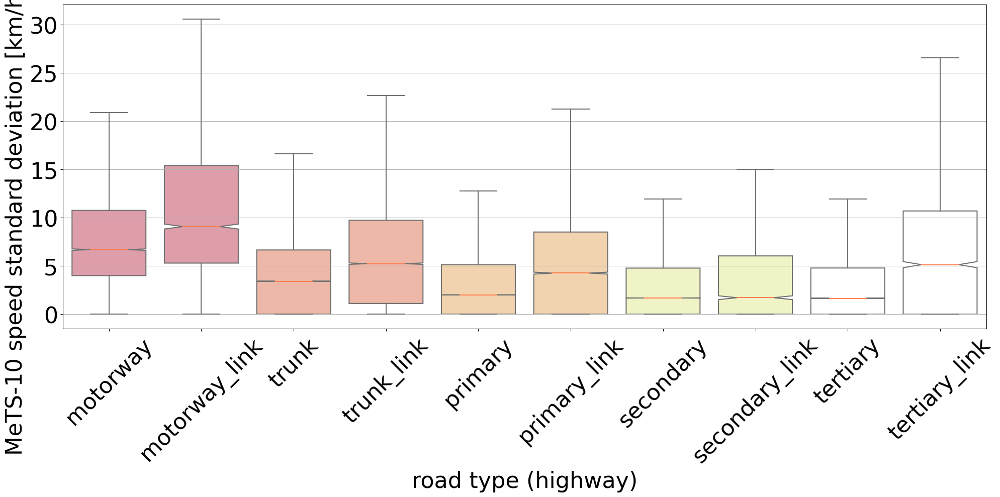

In [33]:
fig, ax = plt.subplots(1, figsize=(20, 10), tight_layout=True)
sns.boxplot(
    ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="std_speed_kph",
    notch=True,
    sym="",
    palette=osm_color_palette(),
    medianprops={"color": "coral"},
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.grid(axis="y")
ax.set(xlabel="road type (highway)", ylabel="MeTS-10 speed standard deviation [km/h]               ")
#  t4c: higher stds in link classes than in the corresponding road class they link -> plausibily, they get probes from the higher class running parallel.
plt.savefig(f"{CITY.title()}_t4c_std_speed_kph.pdf")

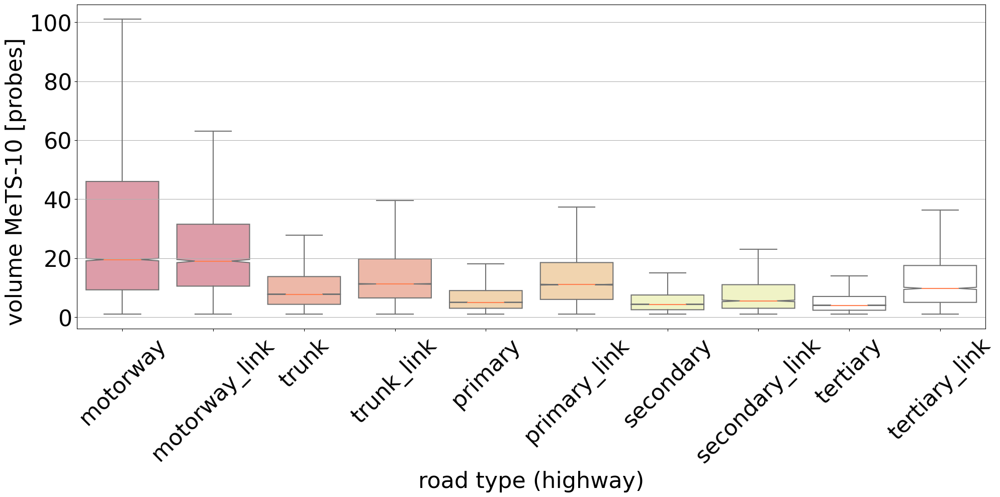

In [34]:
fig, ax = plt.subplots(1, figsize=(20, 10), tight_layout=True)
sns.boxplot(
    ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="volume",
    notch=True,
    sym="",
    palette=osm_color_palette(),
    medianprops={"color": "coral"},
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.grid(axis="y")
ax.set(xlabel="road type (highway)", ylabel="volume MeTS-10 [probes]    ")
# t4c: higher volumes on links than on the class below -> plausibily, they get probes from the higher class running parallel.
plt.savefig(f"{CITY.title()}_t4c_volume.pdf")

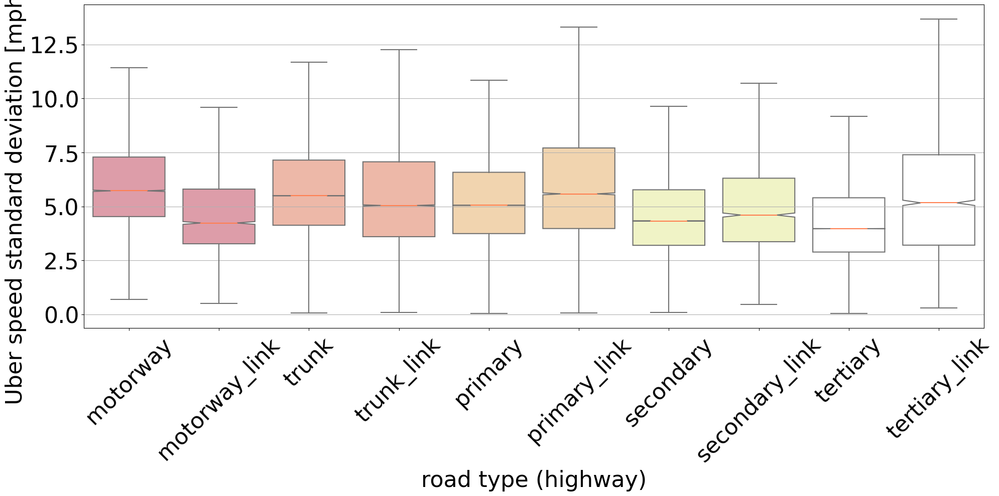

In [35]:
fig, ax = plt.subplots(1, figsize=(20, 10), tight_layout=True)
sns.boxplot(
    ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="speed_mph_stddev",
    notch=True,
    sym="",
    palette=osm_color_palette(),
    medianprops={"color": "coral"},
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.grid(axis="y")
ax.set(xlabel="road type (highway)", ylabel="Uber speed standard deviation [mph]        ")

# Uber: link class have higher std than the class they link to (apart from motorway) -> acceleration/deceleration on links plausible
plt.savefig(f"{CITY.title()}_Uber_speed_mph_stddev.pdf")

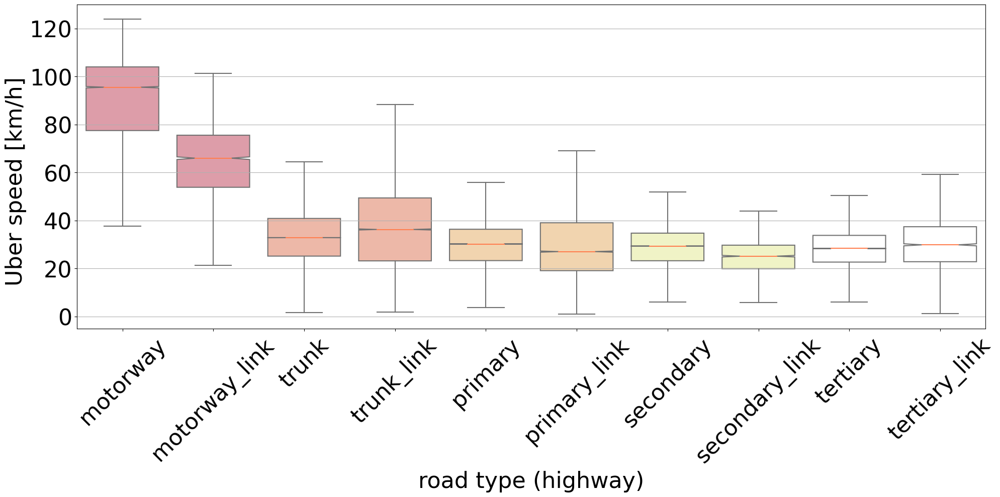

In [36]:
fig, ax = plt.subplots(1, figsize=(20, 10), tight_layout=True)
# sns.boxplot(ut_merged, x='highway', y='speed_kph_mean', ax=ax, palette=osm_color_palette())
sns.boxplot(
    ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="speed_kph_mean",
    notch=True,
    sym="",
    palette=osm_color_palette(),
    medianprops={"color": "coral"},
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.grid(axis="y")
ax.set(xlabel="road type (highway)", ylabel="Uber speed [km/h]    ")
plt.savefig(f"{CITY.title()}_Uber_speed_kph_mean.pdf")

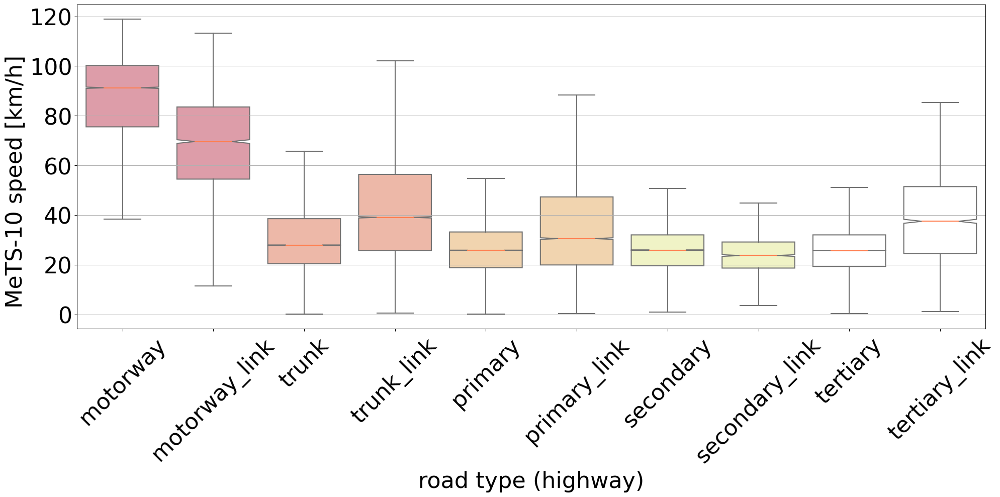

In [37]:
fig, ax = plt.subplots(1, figsize=(20, 10), tight_layout=True)
# sns.boxplot(ut_merged, x='highway', y='speed_kph_mean', ax=ax, palette=osm_color_palette())
sns.boxplot(
    ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="median_speed_kph",
    notch=True,
    sym="",
    palette=osm_color_palette(),
    medianprops={"color": "coral"},
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.grid(axis="y")
ax.set(xlabel="road type (highway)", ylabel="MeTS-10 speed [km/h]    ")
plt.savefig(f"{CITY.title()}_Uber_median_speed_kph.pdf")

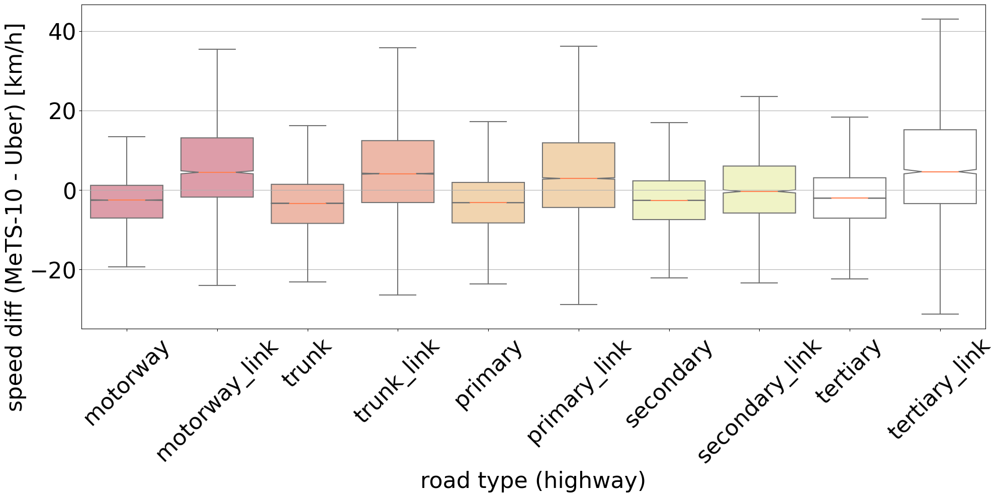

In [38]:
fig, ax = plt.subplots(1, figsize=(20, 10), tight_layout=True)
sns.boxplot(
    ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="speed_diff",
    notch=True,
    sym="",
    palette=osm_color_palette(),
    medianprops={"color": "coral"},
    ax=ax,
)

ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.grid(axis="y")
ax.set(xlabel="road type (highway)", ylabel="speed diff (MeTS-10 - Uber) [km/h]              ")
plt.savefig(f"{CITY.title()}_Uber_speed_diff.pdf")

## APE -- absolute percentage error

In [39]:
ut_merged["ape"] = [abs(d) for d in ut_merged["speed_diff"]]
ut_merged["ape"] = ut_merged["ape"] / ut_merged["speed_kph_mean"]*100

In [40]:
ut_merged["ape"].mean()

28.49180972859707

In [41]:
ut_merged[[simplified_filter_wo_links(hw) for hw in ut_merged["highway"]]]["ape"].mean()

27.161303978088085

In [42]:
ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]]["ape"].median()

19.34083489549547

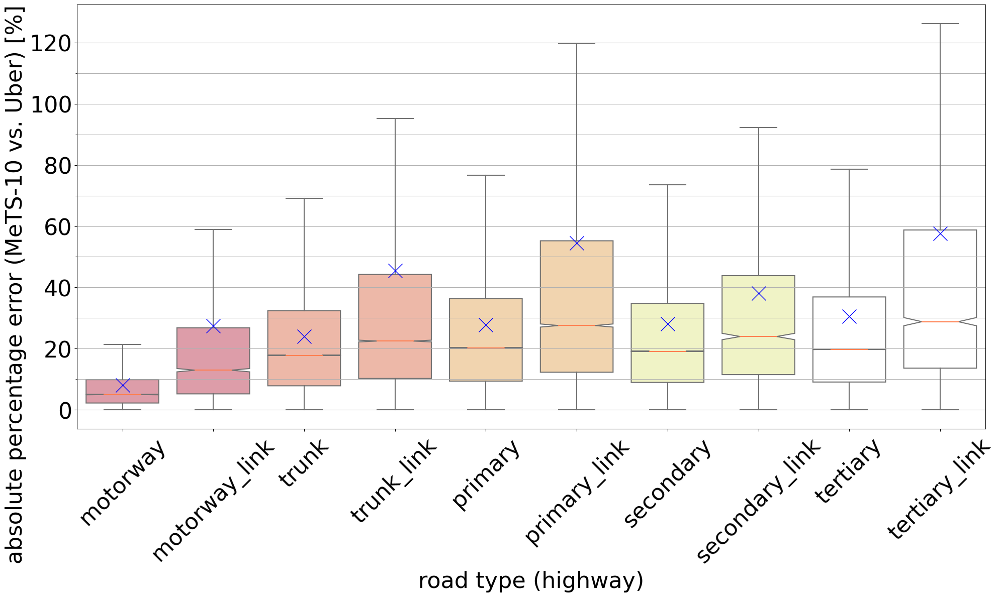

In [43]:
fig, ax = plt.subplots(1, figsize=(20, 12), tight_layout=True)
sns.boxplot(
    ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="ape",
    notch=True,
    sym="",
    palette=osm_color_palette(),
    medianprops={"color": "coral"},
    showmeans=True,
    meanprops={"marker": "x",
               "markeredgecolor": "blue",
               "markersize": "20"
    },
    ax=ax,
)

ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.set_yticks([10 * t for t in range(12)], minor=True)
ax.tick_params(axis="y", which="minor", labelsize=25)
ax.grid(axis="y", which="both")
ax.set(xlabel="road type (highway)", ylabel="absolute percentage error (MeTS-10 vs. Uber) [%]                   ")
plt.savefig(f"{CITY.title()}_Uber_ape.pdf")

## APE by size

In [44]:
def get_size(l):
    if l <= 100:
        return "S (<=100m)"
    elif l <= 500:
        return "M (>100m,<=500m)"
    else:
        return "L (>500m)"

In [45]:
ut_merged["size"] = [get_size(l) for l in ut_merged["length_meters"]]

In [46]:
ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]].groupby(["highway","size"]).mean()["ape"]

/var/folders/4x/y75rw_lj5xx6xc0bmv1gxmq80000gs/T/ipykernel_5568/1258597703.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]].groupby(["highway","size"]).mean()["ape"]


highway         size            
motorway        L (>500m)            7.287615
                M (>100m,<=500m)     8.317712
                S (<=100m)           9.473685
motorway_link   L (>500m)           27.116278
                M (>100m,<=500m)    22.358442
                S (<=100m)          43.739292
primary         L (>500m)           17.711577
                M (>100m,<=500m)    27.089076
                S (<=100m)          28.021480
primary_link    L (>500m)           83.437104
                M (>100m,<=500m)    55.466821
                S (<=100m)          53.741305
secondary       L (>500m)           17.559938
                M (>100m,<=500m)    27.706500
                S (<=100m)          28.150151
secondary_link  M (>100m,<=500m)    30.705910
                S (<=100m)          39.709342
tertiary        L (>500m)           22.359768
                M (>100m,<=500m)    28.881402
                S (<=100m)          31.119178
tertiary_link   L (>500m)           72.205407
 

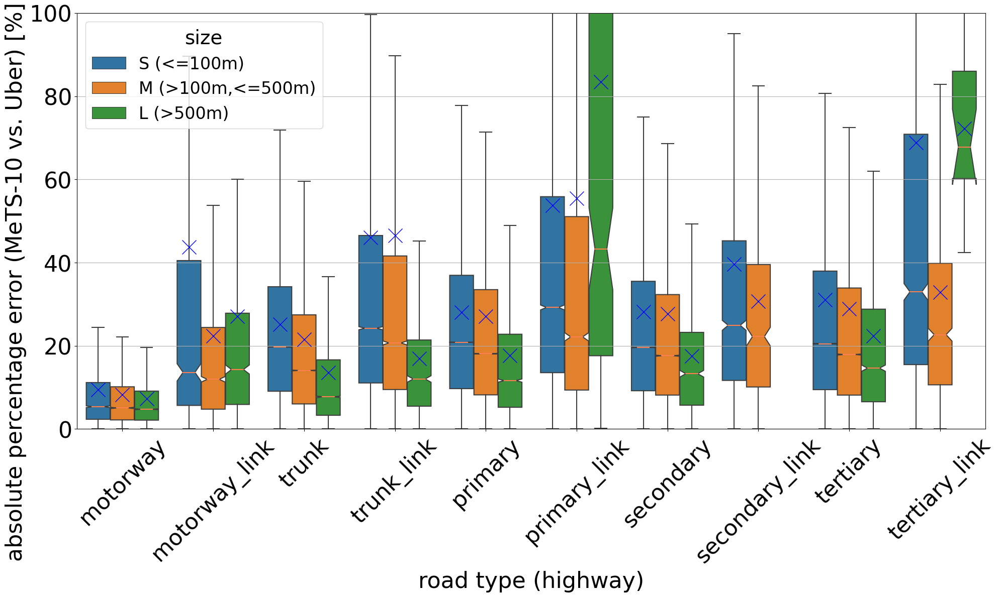

In [47]:
#fig, ax = plt.subplots(1, figsize=(20, 12), tight_layout=True)
#sns.barplot(data=ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]].groupby(["highway","size"]).mean().reset_index().sort_values("sort_key"),
#            x="highway", y="ape", hue="size", ax=ax)

fig, ax = plt.subplots(1, figsize=(20, 12), tight_layout=True)
sns.boxplot(
    data=ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="ape",
    notch=True,
    sym="",
    hue="size",
    hue_order=["S (<=100m)", "M (>100m,<=500m)", "L (>500m)"],
    #palette=osm_color_palette(),
    medianprops={"color": "coral"},
    showmeans=True,
    meanprops={"marker": "x",
               "markeredgecolor": "blue",
               "markersize": "20"
    },
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.grid(axis="y")
ax.set_ylim([0,100])
ax.set(xlabel="road type (highway)", ylabel="absolute percentage error (MeTS-10 vs. Uber) [%]                 ")
plt.savefig(f"{CITY.title()}_Uber_ape_size.pdf")

In [48]:
ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]].groupby(["size"]).mean()["ape"]

/var/folders/4x/y75rw_lj5xx6xc0bmv1gxmq80000gs/T/ipykernel_5568/4009036592.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]].groupby(["size"]).mean()["ape"]


size
L (>500m)           14.187108
M (>100m,<=500m)    26.346164
S (<=100m)          28.197927
Name: ape, dtype: float64

In [49]:
ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]].groupby(["size"]).median()["ape"]

/var/folders/4x/y75rw_lj5xx6xc0bmv1gxmq80000gs/T/ipykernel_5568/902553373.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]].groupby(["size"]).median()["ape"]


size
L (>500m)            7.822829
M (>100m,<=500m)    16.722930
S (<=100m)          20.410188
Name: ape, dtype: float64

## complex road segments

In [50]:
df_cell_mapping = pd.read_parquet(TBASEPATH / "road_graph" / CITY / "road_graph_intersecting_cells.parquet")
df_cell_mapping["intersecting_cells"] = [ast.literal_eval(c) for c in df_cell_mapping["intersecting_cells"]]
df_cell_mapping.columns

Index(['gkey', 'u', 'v', 'osmid', 'speed_kph', 'maxspeed', 'highway', 'oneway',
       'lanes', 'tunnel', 'length_meters', 'geometry', 'name',
       'geometry_reversed', 'intersecting_cells'],
      dtype='object')

<Axes: ylabel='Count'>

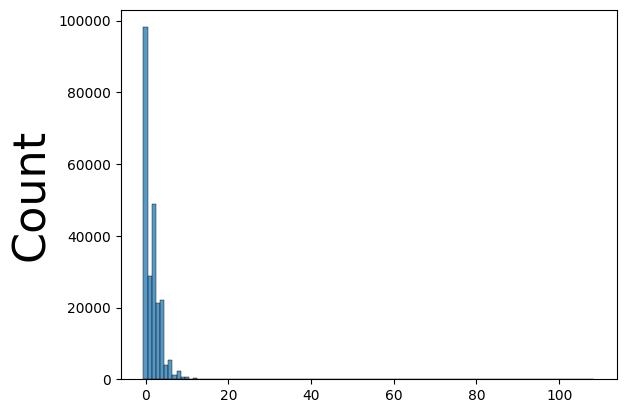

In [51]:
# cell mapping contains the whole road graph, not only box... therefore, the zeros!
sns.histplot([len(ics) for ics in df_cell_mapping["intersecting_cells"]], discrete=True)

In [52]:
hashy = defaultdict(lambda:set())
for u,v,gkey,ic in zip(df_cell_mapping["u"],df_cell_mapping["v"],df_cell_mapping["gkey"],df_cell_mapping["intersecting_cells"]):
#     print((u,v,gkey,ic))
    for c in ic:
        hashy[c[:3]].add((u,v,gkey))
#         print(c[:3])

<Axes: ylabel='Count'>

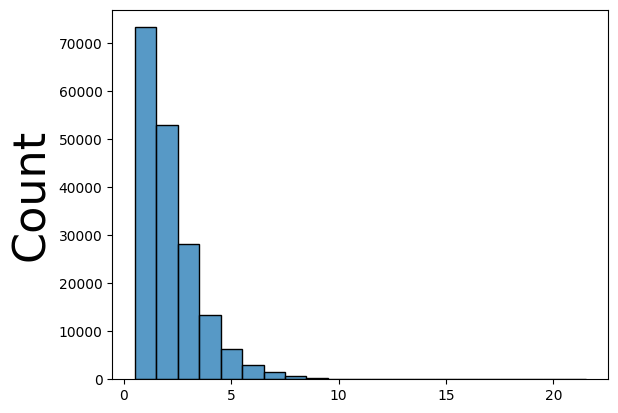

In [53]:
num_segments = []
for cell,segments in hashy.items():
#     print(cell)
#     print(segments)
#     print(len(segments))
    num_segments.append(len(segments))
#     raise
sns.histplot(num_segments, discrete=True)

In [54]:
df_cell_mapping["complex"] = [ np.max([len(hashy[c[:3]]) for c in intersecting_cells ], initial=0) for intersecting_cells in df_cell_mapping["intersecting_cells"]]
df_cell_mapping

,gkey,u,v,osmid,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry,name,geometry_reversed,intersecting_cells,complex
0,78112_25508583_129375498,78112,25508583,129375498,40.4,,unclassified,,,,19.407060,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle,False,"[(172, 223, 2, 0.0), (173, 223, 2, 1.0), (173,...",9.0
1,78112_25508584_129375498,78112,25508584,129375498,40.4,,unclassified,,,,63.857249,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle,False,"[(173, 223, 0, 0.041804563658226324), (172, 22...",8.0
2,99936_2146383887_204647020,99936,2146383887,204647020,48.3,30 mph,unclassified,,,,12.645031,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\x94o\x1...,York Gate,False,"[(176, 216, 0, 1.0)]",7.0
3,99936_4544836433_233623258,99936,4544836433,233623258,48.3,30 mph,unclassified,,,,47.220818,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\x94o\x1...,York Gate,False,"[(175, 216, 1, 0.037851813122377106), (175, 21...",7.0
4,99937_200047_4257261,99937,200047,4257261,48.3,30 mph,unclassified,,,,59.033945,b'\x01\x02\x00\x00\x00\x07\x00\x00\x005\x9a\\\...,York Gate,False,"[(176, 217, 3, 0.0), (176, 216, 1, 1.0), (176,...",11.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234303,6577730921_254761207_358627524,6577730921,254761207,358627524,46.2,,tertiary,,,,134.082828,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\xdfw\xc...,Golborne Road,False,"[(178, 159, 0, 0.4780438104955831), (178, 160,...",5.0
234304,6577730921_6577730928_8227762,6577730921,6577730928,8227762,36.3,,residential,,,,51.325126,b'\x01\x02\x00\x00\x00\x04\x00\x00\x00\xdfw\xc...,Bevington Road,False,"[(178, 160, 2, 0.0), (178, 159, 0, 1.0), (178,...",5.0
234305,6577730928_2379175_700435511,6577730928,2379175,700435511,36.3,,residential,,,,57.576832,b'\x01\x02\x00\x00\x00\x04\x00\x00\x00\x96\x7f...,Bevington Road,False,"[(178, 160, 3, 0.0), (178, 159, 1, 1.0), (178,...",6.0
234306,6577745911_36728211_646234311,6577745911,36728211,646234311,48.3,30 mph,primary,,,,305.243521,b'\x01\x02\x00\x00\x00\x07\x00\x00\x00\x82\xdb...,Coombe Lane,False,"[(289, 130, 2, 0.38704878562390743), (288, 130...",2.0


In [55]:
df_cell_mapping["is_complex"] = df_cell_mapping["complex"]>=5

<Axes: xlabel='complex', ylabel='Count'>

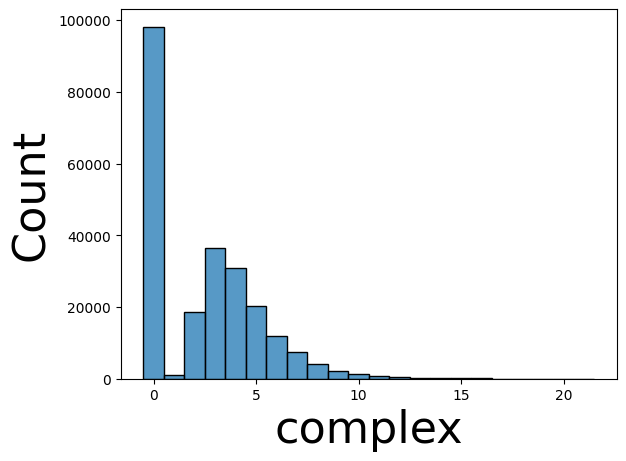

In [56]:
sns.histplot(df_cell_mapping,x="complex",discrete=True)

In [57]:
ut_merged = ut_merged.merge(df_cell_mapping, on=["u","v","gkey"], suffixes=["","_cell_mapping"])
ut_merged.columns

Index(['u', 'v', 'osmid_x', 'year', 'month', 'day', 'hour', 'speed_mph_mean',
       'speed_mph_stddev', 'speed_kph_mean', 'gkey', 'volume_class', 'volume',
       'std_speed_kph', 'median_speed_kph', 'free_flow_kph', 'osmid_y',
       'speed_kph', 'maxspeed', 'highway', 'oneway', 'lanes', 'tunnel',
       'length_meters', 'geometry', 'name', 'node_id', 'x_u', 'y_u',
       'node_id_v', 'x_v', 'y_v', 'in_bb', 'speed_diff', 'sort_key', 'ape',
       'size', 'osmid', 'speed_kph_cell_mapping', 'maxspeed_cell_mapping',
       'highway_cell_mapping', 'oneway_cell_mapping', 'lanes_cell_mapping',
       'tunnel_cell_mapping', 'length_meters_cell_mapping',
       'geometry_cell_mapping', 'name_cell_mapping', 'geometry_reversed',
       'intersecting_cells', 'complex', 'is_complex'],
      dtype='object')

<Axes: xlabel='complex', ylabel='Count'>

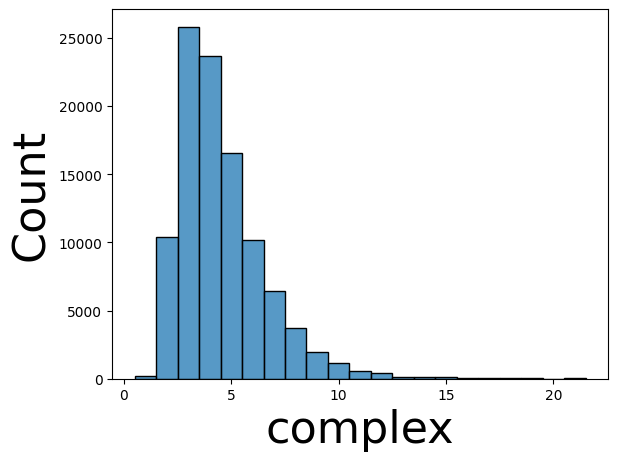

In [58]:
sns.histplot(ut_merged.groupby(["u","v","gkey"]).first().reset_index(), x="complex",discrete=True)

In [59]:
ut_merged.groupby(["u","v","gkey"]).first().reset_index()

,u,v,gkey,osmid_x,year,month,day,hour,speed_mph_mean,speed_mph_stddev,...,oneway_cell_mapping,lanes_cell_mapping,tunnel_cell_mapping,length_meters_cell_mapping,geometry_cell_mapping,name_cell_mapping,geometry_reversed,intersecting_cells,complex,is_complex
0,78112,25508583,78112_25508583_129375498,129375498,2019,10,22,17,28.173,3.061,...,,,,19.407060,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle,False,"[(172, 223, 2, 0.0), (173, 223, 2, 1.0), (173,...",9.0,True
1,78112,25508584,78112_25508584_129375498,129375498,2019,10,23,13,29.133,4.615,...,,,,63.857249,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle,False,"[(173, 223, 0, 0.041804563658226324), (172, 22...",8.0,True
2,99936,4544836433,99936_4544836433_233623258,233623258,2019,10,27,13,6.426,5.245,...,,,,47.220818,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\x94o\x1...,York Gate,False,"[(175, 216, 1, 0.037851813122377106), (175, 21...",7.0,True
3,99937,200047,99937_200047_4257261,4257261,2019,10,27,10,7.078,5.810,...,,,,59.033945,b'\x01\x02\x00\x00\x00\x07\x00\x00\x005\x9a\\\...,York Gate,False,"[(176, 217, 3, 0.0), (176, 216, 1, 1.0), (176,...",11.0,True
4,99937,1137916959,99937_1137916959_18769878,18769878,2019,10,21,12,3.700,2.993,...,,,,78.922306,b'\x01\x02\x00\x00\x00\x05\x00\x00\x005\x9a\\\...,Marylebone Road,False,"[(176, 217, 3, 0.0), (176, 216, 1, 0.275139904...",11.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101700,6577730921,2379175,6577730921_2379175_358627524,358627524,2019,10,25,17,12.218,3.080,...,,,,7.639807,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\xdfw\xc...,Golborne Road,False,"[(178, 159, 3, 1.0)]",6.0,True
101701,6577730921,254761207,6577730921_254761207_358627524,358627524,2019,10,22,12,14.228,3.880,...,,,,134.082828,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\xdfw\xc...,Golborne Road,False,"[(178, 159, 0, 0.4780438104955831), (178, 160,...",5.0,True
101702,6577730928,2379175,6577730928_2379175_700435511,700435511,2019,10,23,16,6.051,2.227,...,,,,57.576832,b'\x01\x02\x00\x00\x00\x04\x00\x00\x00\x96\x7f...,Bevington Road,False,"[(178, 160, 3, 0.0), (178, 159, 1, 1.0), (178,...",6.0,True
101703,6577745911,36728211,6577745911_36728211_646234311,646234311,2019,10,27,15,29.218,2.227,...,,,,305.243521,b'\x01\x02\x00\x00\x00\x07\x00\x00\x00\x82\xdb...,Coombe Lane,False,"[(289, 130, 2, 0.38704878562390743), (288, 130...",2.0,False


In [60]:
road_counts = ut_merged.groupby(["u","v","gkey"]).first().reset_index().groupby("highway").agg(count=('gkey','count'), sort_key=('sort_key', 'first')).reset_index().sort_values("sort_key")
road_counts

,highway,count,sort_key
1,motorway,308,0
2,motorway_link,107,1
12,trunk,11753,2
13,trunk_link,741,3
3,primary,32777,4
4,primary_link,447,5
7,secondary,13001,6
8,secondary_link,70,7
10,tertiary,21660,8
11,tertiary_link,109,9


In [61]:
road_counts_complex_non_complex = ut_merged.groupby(["u","v","gkey"]).first().reset_index().groupby(["highway", "is_complex"]).agg(count=('gkey','count'), sort_key=('sort_key', 'first')).reset_index().sort_values("sort_key")
road_counts_complex_non_complex

,highway,is_complex,count,sort_key
2,motorway,False,237,0
3,motorway,True,71,0
4,motorway_link,False,52,1
5,motorway_link,True,55,1
24,trunk,True,5966,2
23,trunk,False,5787,2
26,trunk_link,True,582,3
25,trunk_link,False,159,3
6,primary,False,17961,4
7,primary,True,14816,4


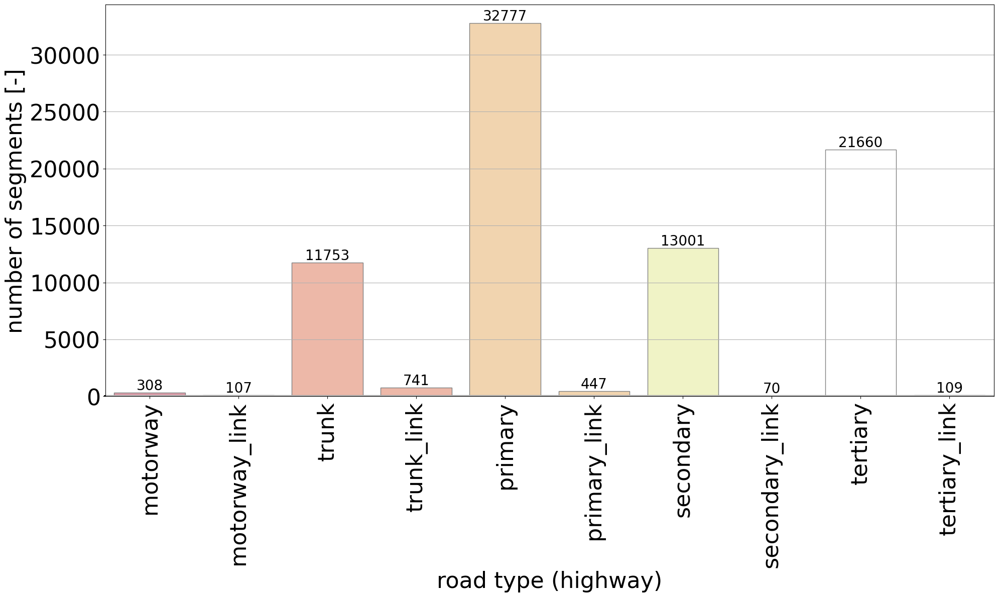

In [62]:
fig, ax = plt.subplots(1, figsize=(20, 12), tight_layout=True)
sns.barplot(
    data=road_counts[[simplified_filter(hw) for hw in road_counts["highway"]]], 
    x="highway", 
    y="count",
    palette=osm_color_palette(),
    linewidth=1,
    edgecolor=".5",
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=90)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.set_yticks([10 * t for t in range(12)], minor=True)
ax.tick_params(axis="y", which="minor", labelsize=25)
ax.grid(axis="y", which="both")
ax.set(xlabel="road type (highway)", ylabel="number of segments [-]")
ax.bar_label(container=ax.containers[0], labels=[int(f) for f in ax.containers[0].datavalues], size=20)
plt.savefig(f"{CITY.title()}_Uber_segment_counts.pdf")

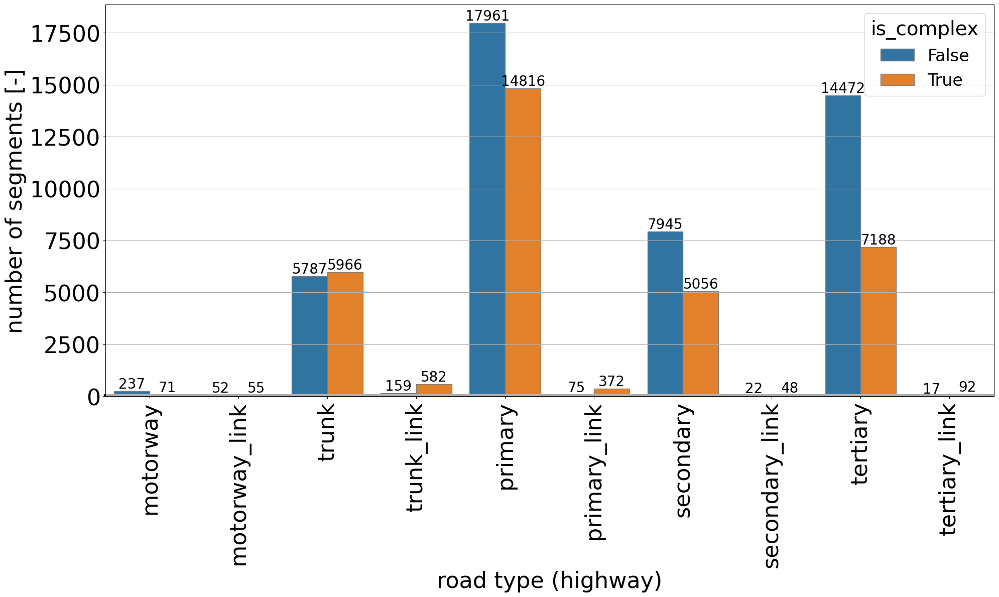

In [63]:
fig, ax = plt.subplots(1, figsize=(20, 12), tight_layout=True)
sns.barplot(
    data=road_counts_complex_non_complex[[simplified_filter(hw) for hw in road_counts_complex_non_complex["highway"]]], 
    x="highway", 
    y="count",
    hue="is_complex",
#     palette=osm_color_palette(),
    linewidth=1,
    edgecolor=".5",
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=90)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.set_yticks([10 * t for t in range(12)], minor=True)
ax.tick_params(axis="y", which="minor", labelsize=25)
ax.grid(axis="y", which="both")
ax.set(xlabel="road type (highway)", ylabel="number of segments [-]")
ax.bar_label(container=ax.containers[0], labels=[f"{f:.0f}" for f in ax.containers[0].datavalues], size=20)
ax.bar_label(container=ax.containers[1], labels=[f"{f:.0f}" for f in ax.containers[1].datavalues], size=20)
plt.savefig(f"{CITY.title()}_Uber_segment_counts_complex_non_complex.pdf")

## APE complex vs. non-complex

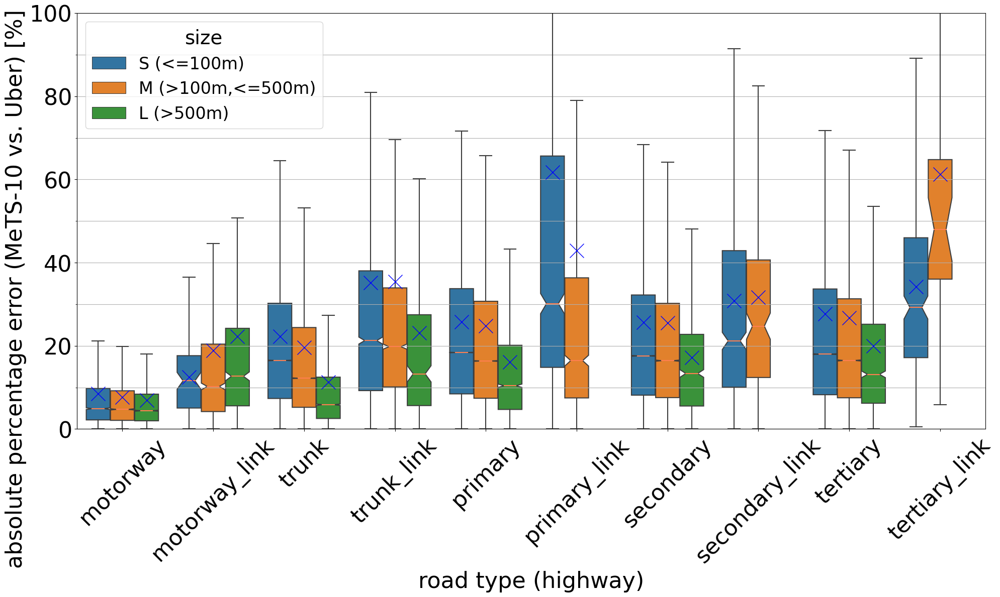

In [64]:
fig, ax = plt.subplots(1, figsize=(20, 12), tight_layout=True)
sns.boxplot(
    ut_merged[(~ut_merged["is_complex"])&[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="ape",
    notch=True,
    sym="",
    hue="size",
    hue_order=["S (<=100m)", "M (>100m,<=500m)", "L (>500m)"],
    #palette=osm_color_palette(),
    medianprops={"color": "coral"},
    #flierprops={"marker": "x"},
    #boxprops={"facecolor": (.4, .6, .8, .5)},
    showmeans=True,
    meanprops={"marker": "x",
               "markeredgecolor": "blue",
               "markersize": "20"
    },
    ax=ax,
)
ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.set_yticks([10 * t for t in range(12)], minor=True)
ax.tick_params(axis="y", which="minor", labelsize=25)
ax.grid(axis="y", which="both")
ax.set(xlabel="road type (highway)", ylabel="absolute percentage error (MeTS-10 vs. Uber) [%]                   ")
ax.set_ylim([0,100])
plt.savefig(f"{CITY.title()}_Uber_ape_non_complex.pdf")

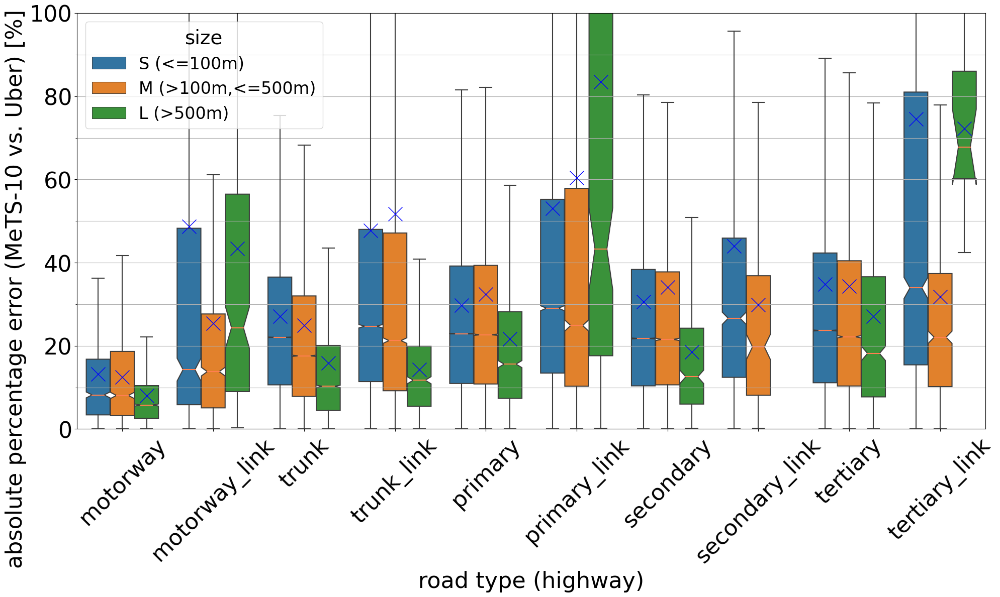

In [65]:
fig, ax = plt.subplots(1, figsize=(20, 12), tight_layout=True)
sns.boxplot(
    ut_merged[(ut_merged["is_complex"])&[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="highway",
    y="ape",
    notch=True,
    sym="",
    hue="size",
    hue_order=["S (<=100m)", "M (>100m,<=500m)", "L (>500m)"],
    #palette=osm_color_palette(),
    medianprops={"color": "coral"},
    showmeans=True,
    meanprops={"marker": "x",
               "markeredgecolor": "blue",
               "markersize": "20"
    },
    ax=ax,
)

ax.tick_params(axis="x", which="major", labelsize=32, rotation=45)
ax.tick_params(axis="y", which="major", labelsize=32)
ax.set_yticks([10 * t for t in range(12)], minor=True)
ax.tick_params(axis="y", which="minor", labelsize=25)
ax.grid(axis="y", which="both")
ax.set(xlabel="road type (highway)", ylabel="absolute percentage error (MeTS-10 vs. Uber) [%]                   ")
ax.set_ylim([0,100])
plt.savefig(f"{CITY.title()}_Uber_ape_complex.pdf")

In [66]:
ut_merged[~ut_merged["is_complex"]].groupby(["highway","size"]).mean()["ape"]

/var/folders/4x/y75rw_lj5xx6xc0bmv1gxmq80000gs/T/ipykernel_5568/2491895895.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ut_merged[~ut_merged["is_complex"]].groupby(["highway","size"]).mean()["ape"]


highway         size            
living_street   M (>100m,<=500m)    32.135043
                S (<=100m)          32.409929
motorway        L (>500m)            6.987332
                M (>100m,<=500m)     7.625615
                S (<=100m)           8.509581
motorway_link   L (>500m)           22.236009
                M (>100m,<=500m)    18.908767
                S (<=100m)          12.496840
primary         L (>500m)           16.107785
                M (>100m,<=500m)    24.754191
                S (<=100m)          25.820102
primary_link    M (>100m,<=500m)    42.864148
                S (<=100m)          61.758951
residential     L (>500m)           31.013458
                M (>100m,<=500m)    31.014660
                S (<=100m)          35.311869
road            S (<=100m)          55.927987
secondary       L (>500m)           17.188632
                M (>100m,<=500m)    25.484487
                S (<=100m)          25.603665
secondary_link  M (>100m,<=500m)    31.719617
 

In [67]:
ut_merged[ut_merged["is_complex"]].groupby(["highway","size"]).mean()["ape"]

/var/folders/4x/y75rw_lj5xx6xc0bmv1gxmq80000gs/T/ipykernel_5568/2922163868.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ut_merged[ut_merged["is_complex"]].groupby(["highway","size"]).mean()["ape"]


highway         size            
living_street   M (>100m,<=500m)    30.591426
                S (<=100m)          35.167572
motorway        L (>500m)            8.078733
                M (>100m,<=500m)    12.438212
                S (<=100m)          13.159189
motorway_link   L (>500m)           43.405246
                M (>100m,<=500m)    25.372837
                S (<=100m)          48.710872
primary         L (>500m)           21.698114
                M (>100m,<=500m)    32.443158
                S (<=100m)          29.753413
primary_link    L (>500m)           83.437104
                M (>100m,<=500m)    60.363631
                S (<=100m)          53.010087
residential     L (>500m)           29.536491
                M (>100m,<=500m)    36.544385
                S (<=100m)          43.099553
secondary       L (>500m)           18.560694
                M (>100m,<=500m)    34.059559
                S (<=100m)          30.549858
secondary_link  M (>100m,<=500m)    29.829429
 

In [68]:
df_edges[df_edges["u"] == 3240063179]

,gkey,u,v,osmid,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry,name,node_id,x_u,y_u,node_id_v,x_v,y_v,in_bb
220959,3240063179_1249708436_8599345,3240063179,1249708436,8599345,32.2,20 mph,primary,,,,4.346146,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00t\x1e_\x...,London Bridge,3240063179,-0.088403,51.506295,1249708436,-0.088381,51.506327,True


In [69]:
tspeeds_df.columns

Index(['u', 'v', 'gkey', 'year', 'month', 'day', 'hour', 'volume_class',
       'volume', 'std_speed_kph', 'median_speed_kph', 'free_flow_kph'],
      dtype='object')

In [70]:
def plot_dayline(u, v, day):
    fig, ax = plt.subplots(1, figsize=(10, 5), tight_layout=True, sharex=True, sharey=True)
    ax2 = ax.twinx()

    t_data = tspeeds_df[(tspeeds_df["u"] == u) & (tspeeds_df["v"] == v) & (tspeeds_df["day"] == day)].sort_values("hour")
    sns.lineplot(t_data, x="hour", y="median_speed_kph", ax=ax, color="orange")
    sns.lineplot(t_data, x="hour", y="volume", ax=ax, color="red")
    ax.errorbar(t_data["hour"], t_data["median_speed_kph"], yerr=t_data["std_speed_kph"], capsize=2, capthick=0.5, color="orange", linewidth=0.5, linestyle=":")

    u_data = uspeeds_df[(uspeeds_df["u"] == u) & (uspeeds_df["v"] == v) & (uspeeds_df["day"] == day)].sort_values("hour")
    sns.lineplot(u_data, x="hour", y="speed_kph_mean", ax=ax2, color="blue")
    ax.errorbar(u_data["hour"], u_data["speed_kph_mean"], yerr=u_data["speed_mph_stddev"], capsize=2, capthick=0.5, color="blue", linewidth=0.5, linestyle=":")
    rec = df_edges[(df_edges["u"] == u) & (df_edges["v"] == v)].iloc[0]
    [min([u_data["speed_kph_mean"].min(), t_data["median_speed_kph"].min()]), max([u_data["speed_kph_mean"].max(), t_data["median_speed_kph"].max()])]
    ax.set_ylim([0, 120])
    ax2.set_ylim([0, 120])
    #     print(rec)
    plt.title(f"{rec['name']}, {rec['highway']} {rec['length_meters']:.2f}m")

In [71]:
#         # 3240063179	3153656030		['King William Street', 'London Bridge']
#         ("London bridge, northbound", 3240063179, 3153656030),
#         # 2180693488	1868411754	A3	Elephant and Castle
#         ("Elephant and castle, northbound", 2180693488, 1868411754),
#         #	1178910690	197630	0		A40	['Marylebone Flyover', 'Westway']
#         ("Marylebone flyover, eastbound", 2180693488, 1868411754),
#         # 195975	28419372		M25		motorway
#         ("M25 near Waltham, eastbound", 195975, 28419372),
#         # 	208885668	257550997	M25		motorway
#         ("M25 near Potters Bar, westbound", 208885668, 257550997)

### "London bridge, northbound"

In [72]:
# u = 3240063179, v = 1249708436,

In [73]:
u = 1249708436
v = 25161387

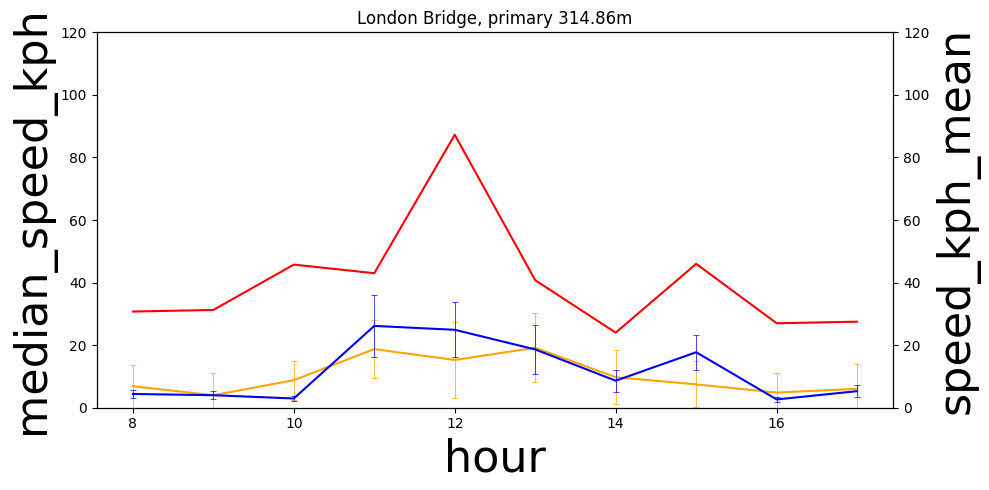

In [74]:
plot_dayline(u=u, v=v, day=21)

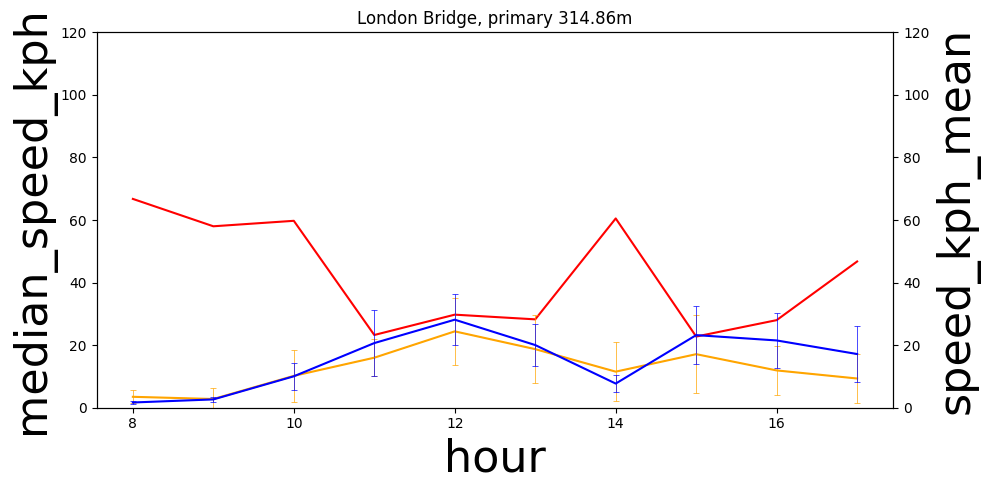

In [75]:
plot_dayline(u=u, v=v, day=22)

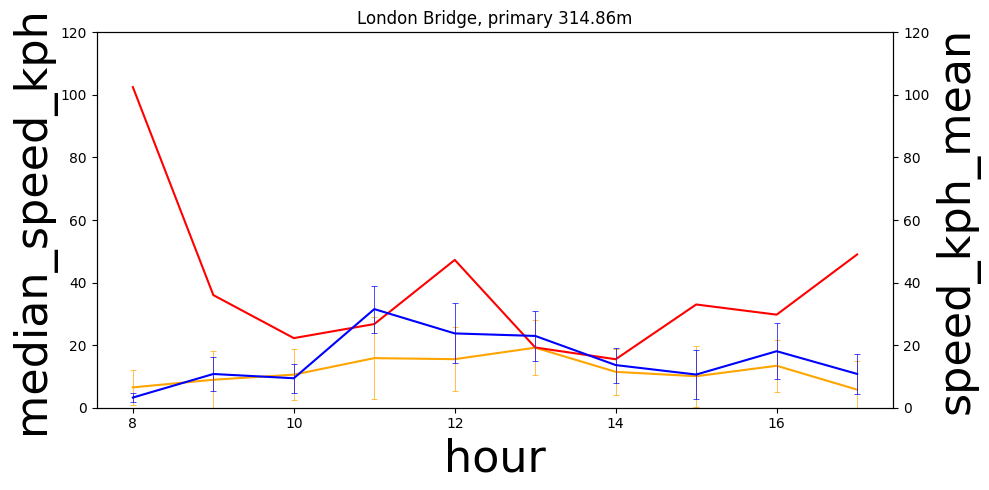

In [76]:
plot_dayline(u=u, v=v, day=23)

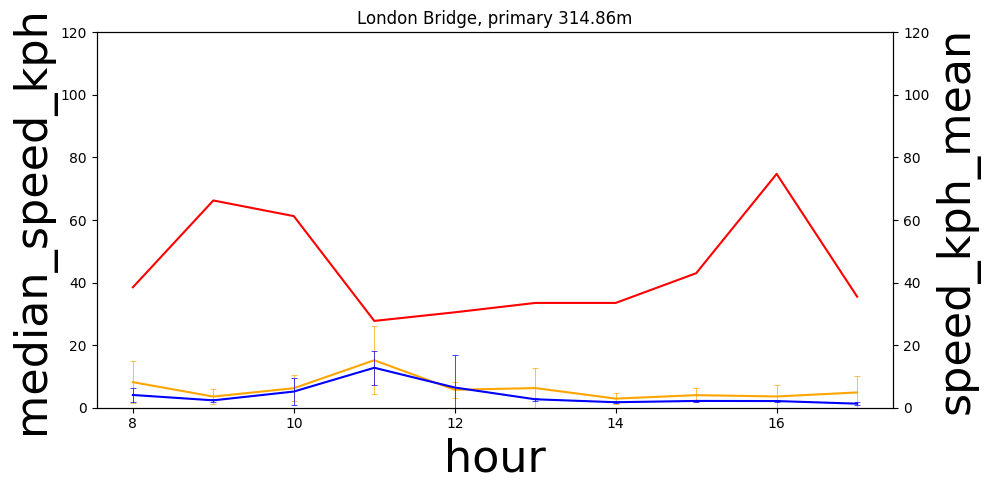

In [77]:
plot_dayline(u=u, v=v, day=24)

###         ("Marylebone flyover, eastbound", 2180693488, 1868411754),

In [78]:
u = 2180693488
v = 3890206825

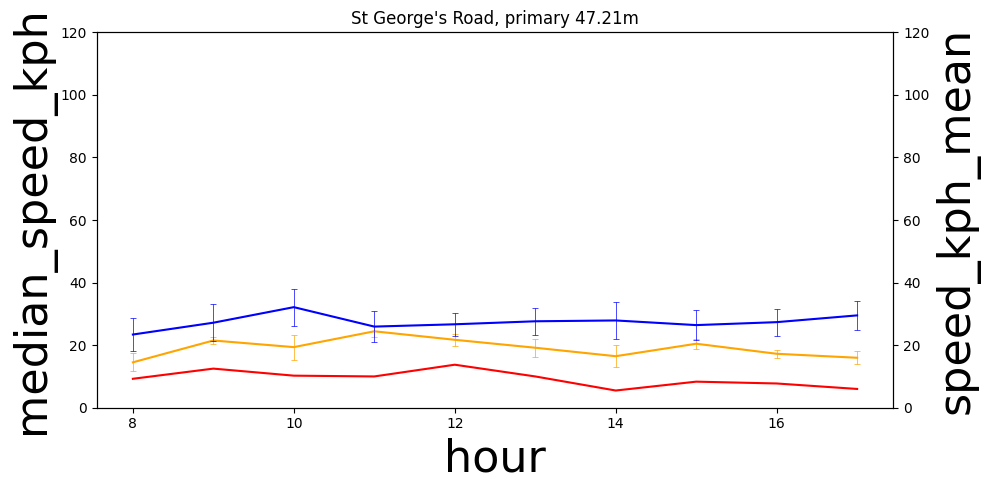

In [79]:
plot_dayline(u=u, v=v, day=21)

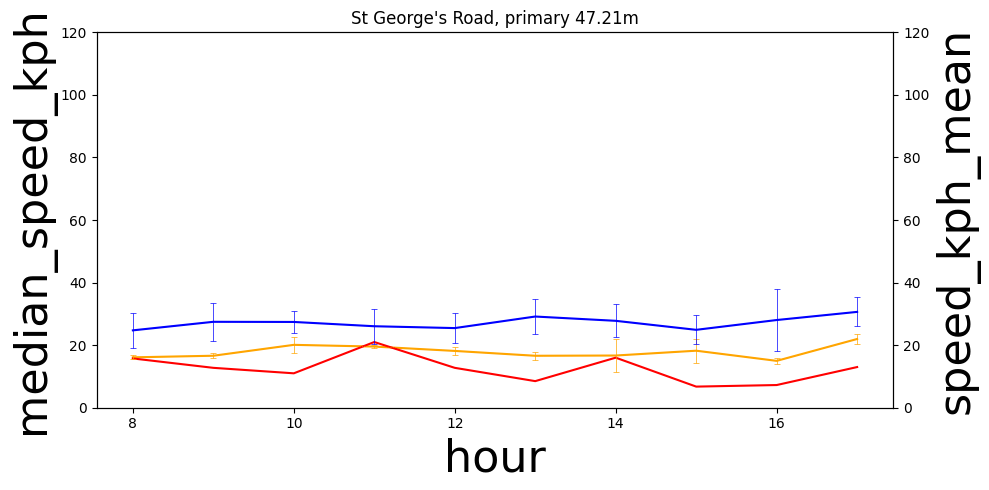

In [80]:
plot_dayline(u=u, v=v, day=22)

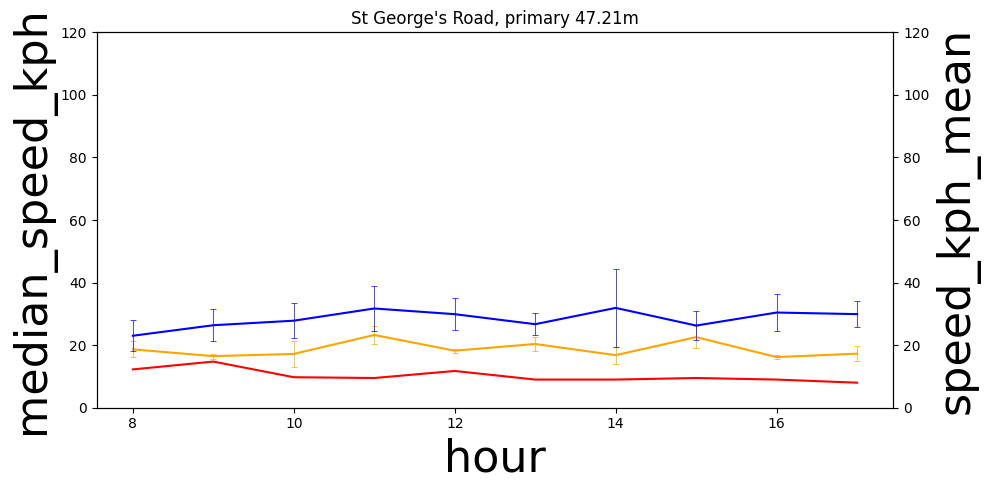

In [81]:
plot_dayline(u=u, v=v, day=23)

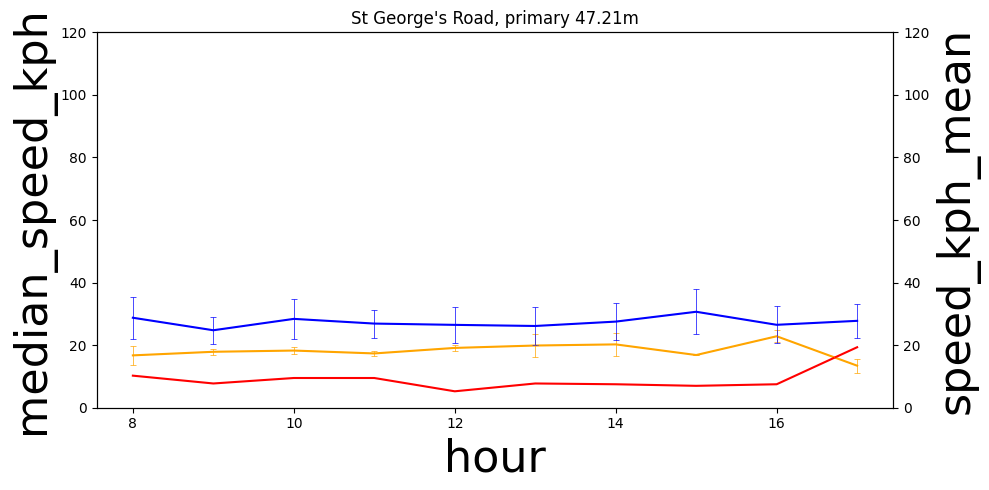

In [82]:
plot_dayline(u=u, v=v, day=24)

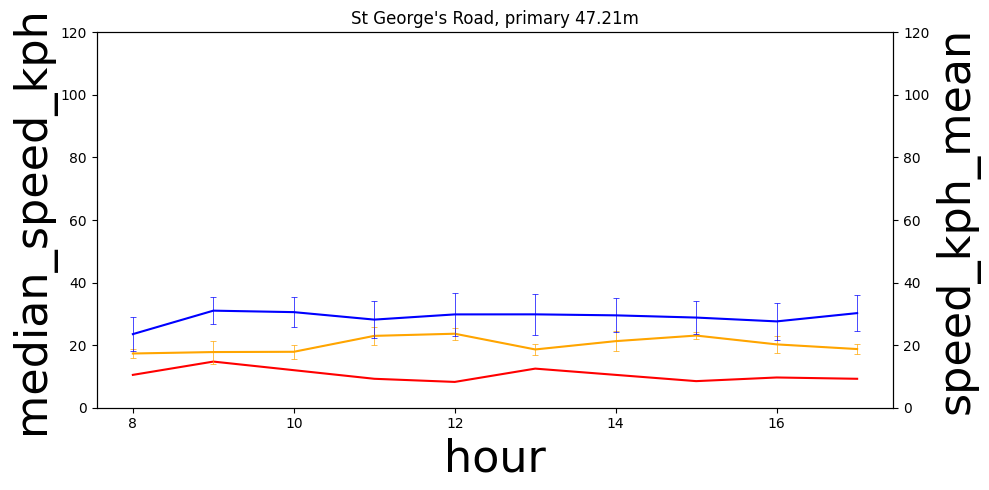

In [83]:
plot_dayline(u=u, v=v, day=25)

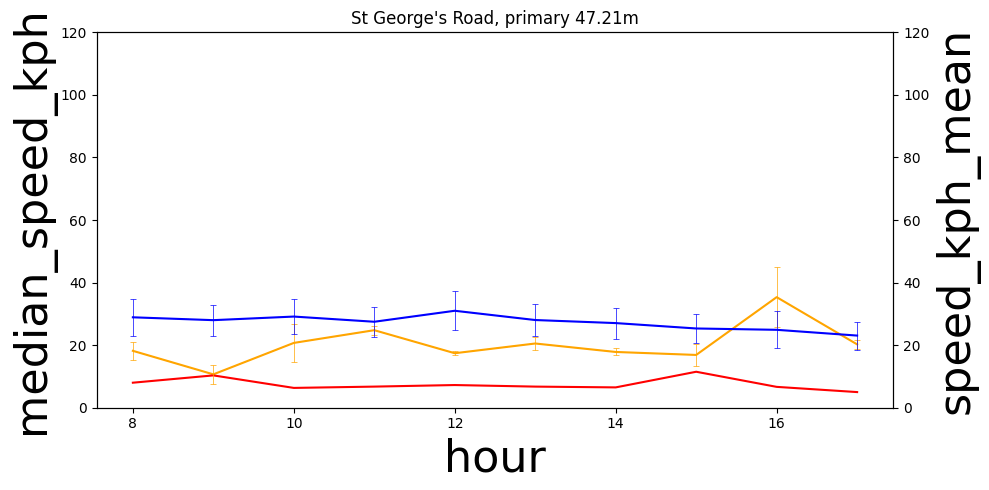

In [84]:
# Saturday
plot_dayline(u=u, v=v, day=26)

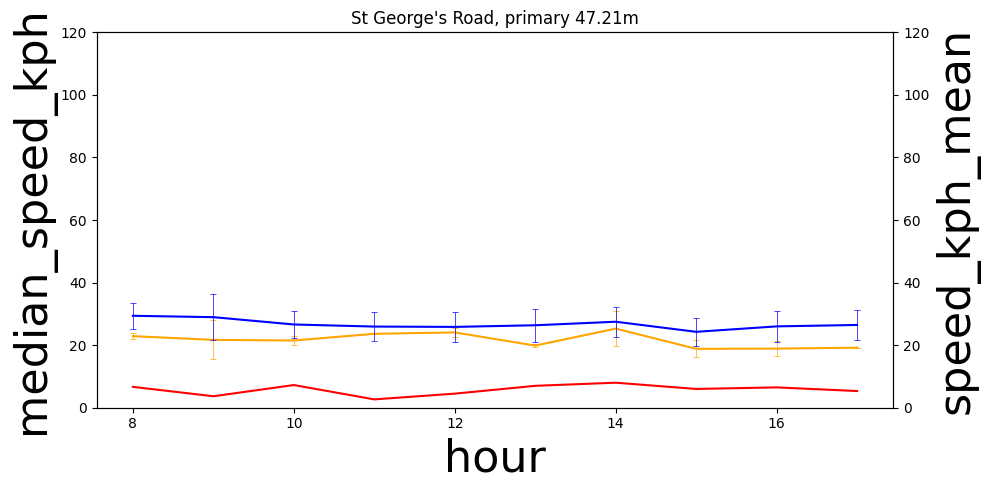

In [85]:
plot_dayline(u=u, v=v, day=27)

### ("M25 near Waltham, eastbound", 195975, 28419372),

In [86]:
u = 195975
v = 195965

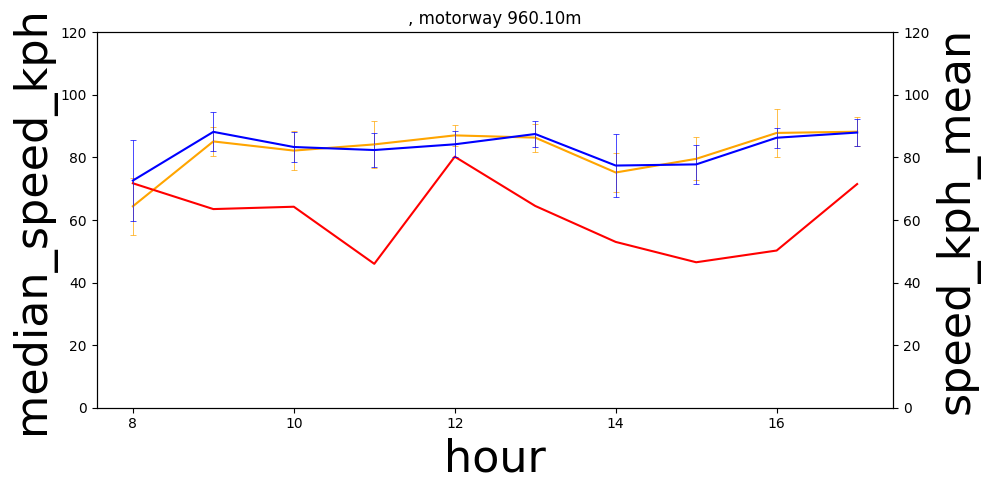

In [87]:
plot_dayline(u=u, v=v, day=21)

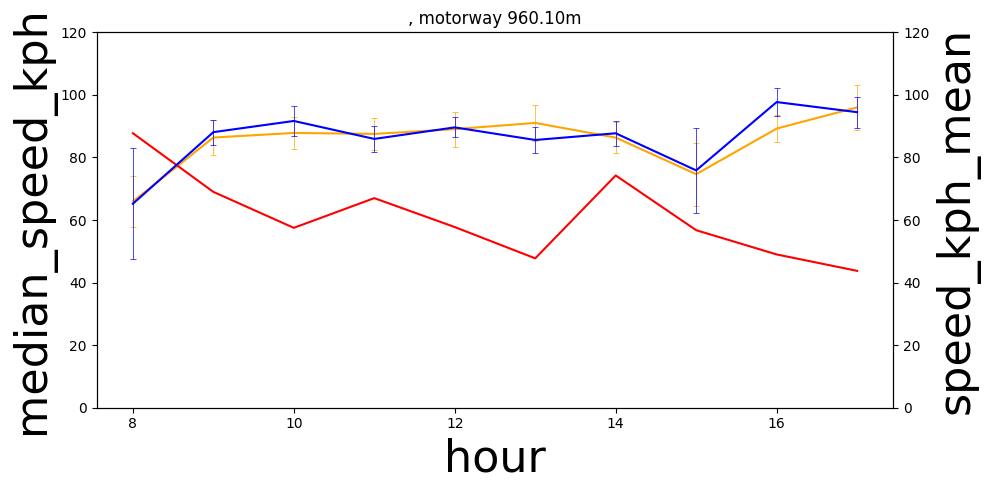

In [88]:
plot_dayline(u=u, v=v, day=22)

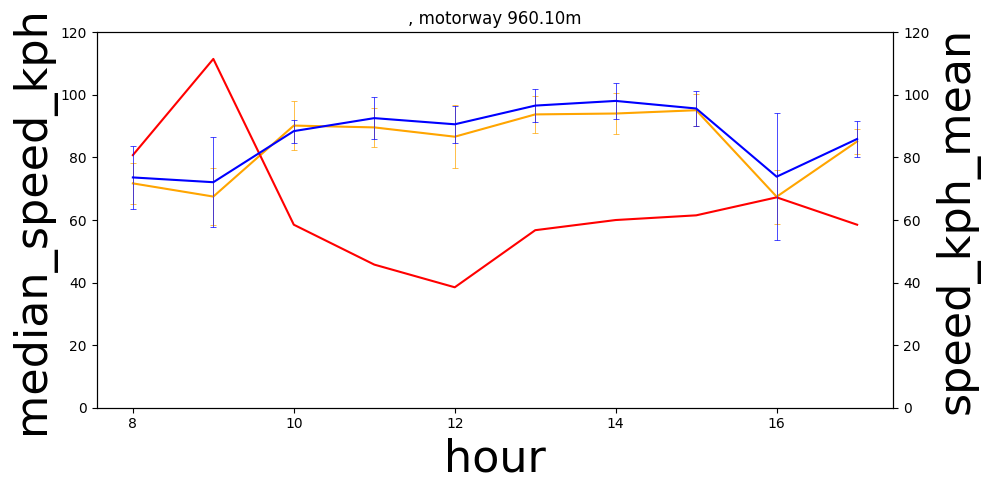

In [89]:
plot_dayline(u=u, v=v, day=23)

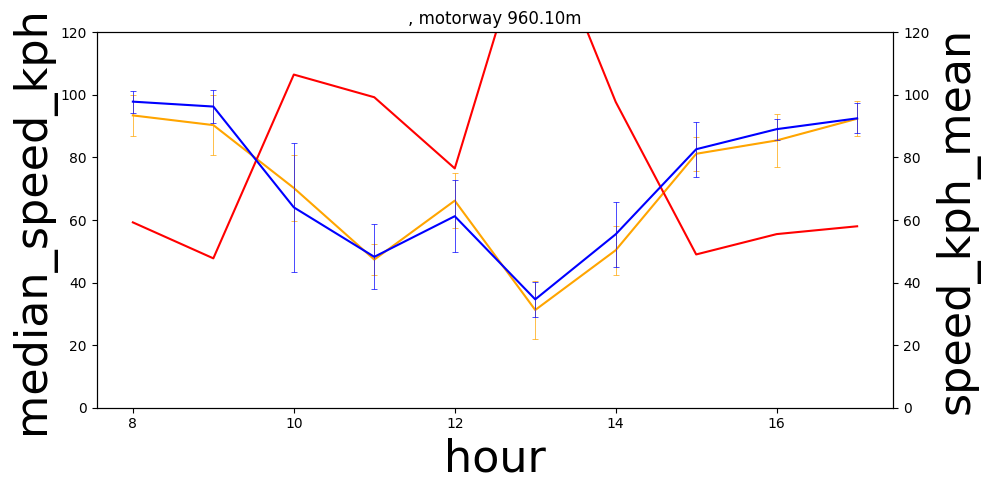

In [90]:
plot_dayline(u=u, v=v, day=24)

###  ("M25 near Potters Bar, westbound", 208885668, 257550997)

In [91]:
u = 208885668
v = 195875

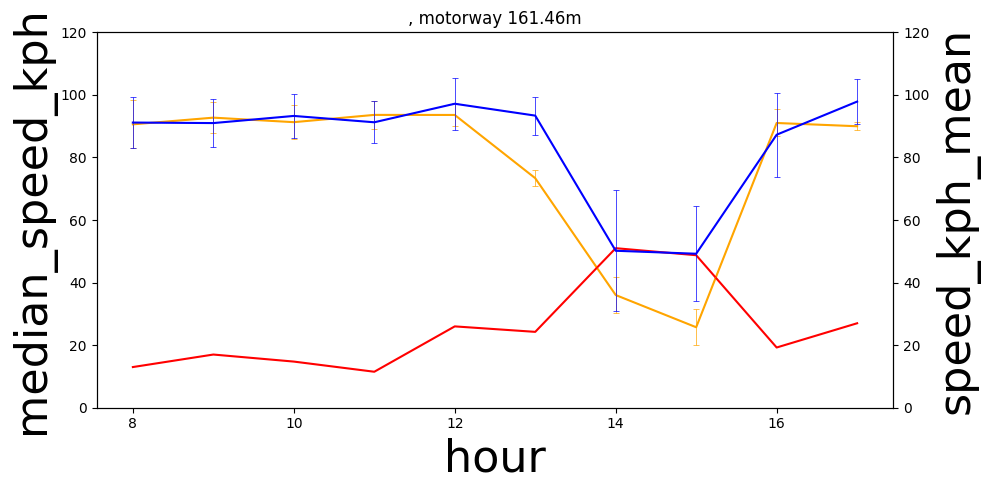

In [92]:
plot_dayline(u=u, v=v, day=21)

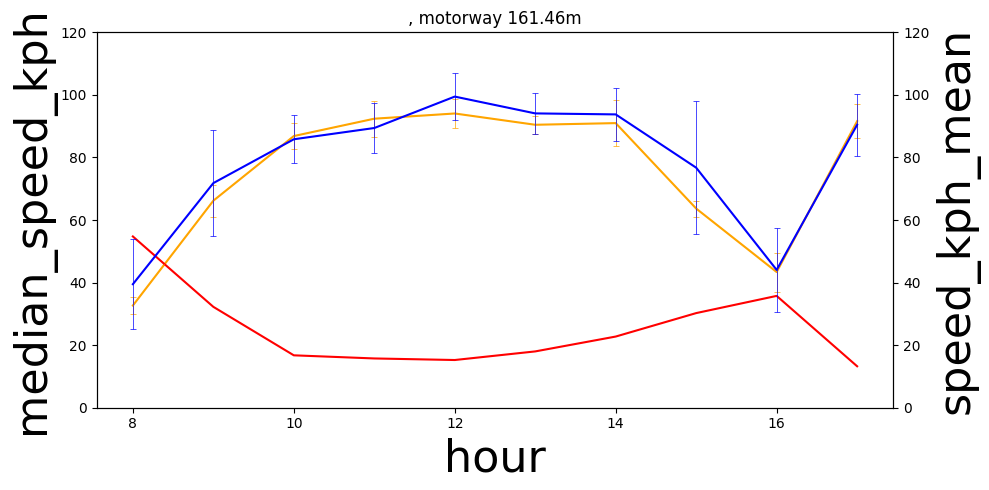

In [93]:
plot_dayline(u=u, v=v, day=22)

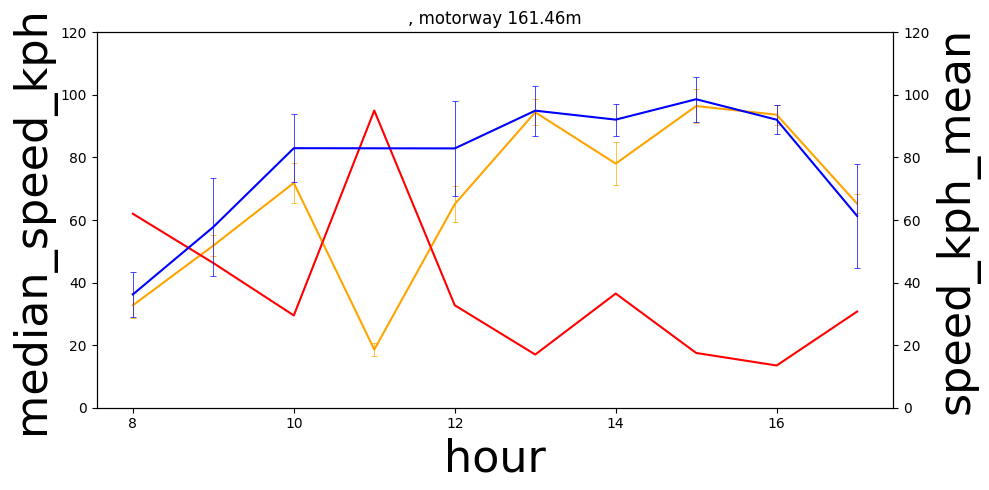

In [94]:
plot_dayline(u=u, v=v, day=23)

## KDE

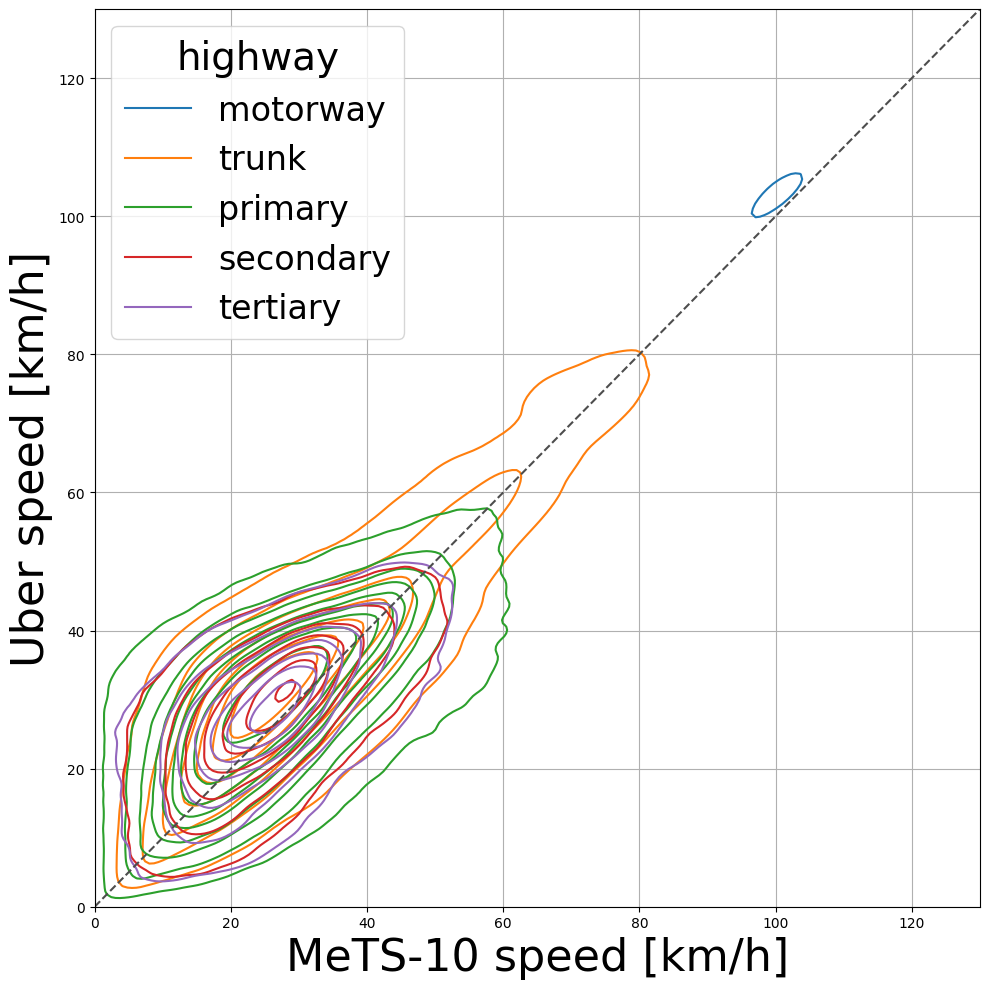

In [95]:
fig, ax = plt.subplots(1, tight_layout=True, figsize=(10, 10))
sns.kdeplot(
    data=ut_merged[[simplified_filter(hw) and "link" not in hw for hw in ut_merged["highway"]]], x="median_speed_kph", y="speed_kph_mean", hue="highway", ax=ax
)
ax.plot([0, 130], [0, 130], ls="--", c=".3")
ax.set_xlim([0, 130])
ax.set_ylim([0, 130])
ax.grid(axis="both")
ax.set(xlabel="MeTS-10 speed [km/h]", ylabel="Uber speed [km/h]")
plt.savefig(f"{CITY.title()}_Uber_kde_highway_non_links.pdf")

In [96]:
# fig, ax = plt.subplots(1, tight_layout=True, figsize=(10, 10))
# sns.kdeplot(
#     data=ut_merged[[simplified_filter(hw) and "link" in hw for hw in ut_merged["highway"]]], x="median_speed_kph", y="speed_kph_mean", hue="highway", ax=ax
# )
# ax.plot([0, 130], [0, 130], ls="--", c=".3")
# ax.set_xlim([0, 130])
# ax.set_ylim([0, 130])
# ax.grid(axis="both")
# ax.set(xlabel='MeTS-10 speed [km/h]',
#        ylabel='Uber speed [km/h]')
# plt.savefig(f"{CITY.title()}_Uber_kde_highway_links.pdf")

/var/folders/4x/y75rw_lj5xx6xc0bmv1gxmq80000gs/T/ipykernel_5568/86999985.py:24: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"{CITY.title()}_Uber_scatter_highway.png")
/Users/che/Miniconda3/miniconda3/envs/mets-10/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


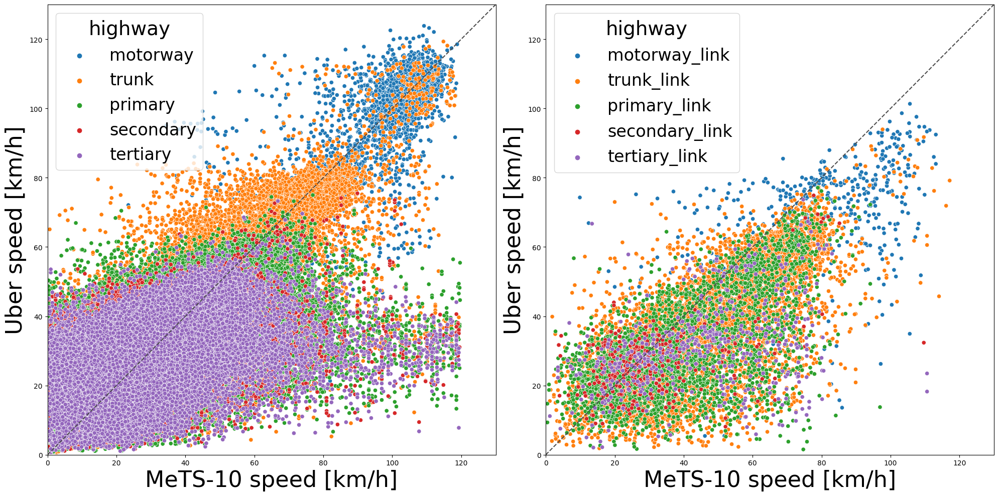

In [ ]:
fig, axs = plt.subplots(1, 2, tight_layout=True, figsize=(20, 10))
ax0, ax1 = axs
sns.scatterplot(
    data=ut_merged[[simplified_filter(hw) and "link" not in hw for hw in ut_merged["highway"]] & (ut_merged["day"] == END_DAY)],
    x="median_speed_kph",
    y="speed_kph_mean",
    hue="highway",
    ax=ax0,
)
sns.scatterplot(
    data=ut_merged[[simplified_filter(hw) and "link" in hw for hw in ut_merged["highway"]] & (ut_merged["day"] == END_DAY)],
    x="median_speed_kph",
    y="speed_kph_mean",
    hue="highway",
    ax=ax1,
)

for ax in axs:
    ax.plot([0, 130], [0, 130], ls="--", c=".3")
    ax.set_xlim([0, 130])
    ax.set_ylim([0, 130])
    ax.set(xlabel="MeTS-10 speed [km/h]", ylabel="Uber speed [km/h]")

plt.savefig(f"{CITY.title()}_Uber_scatter_highway.png")

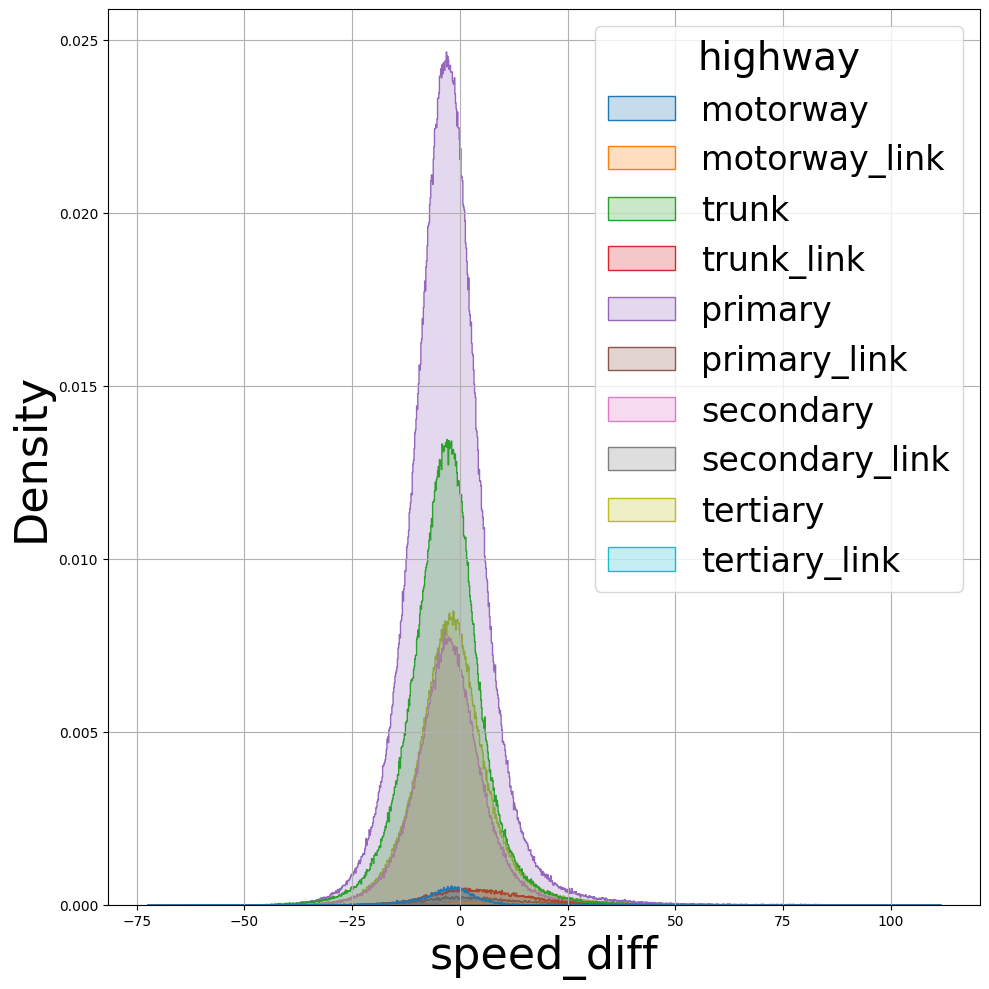

In [98]:
fig, ax = plt.subplots(1, tight_layout=True, figsize=(10, 10))
sns.histplot(data=ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]], x="speed_diff", hue="highway", element="step", stat="density")
# ax.set_yscale('log')
ax.grid()
plt.savefig(f"{CITY.title()}_Uber_histogram_highway.pdf")

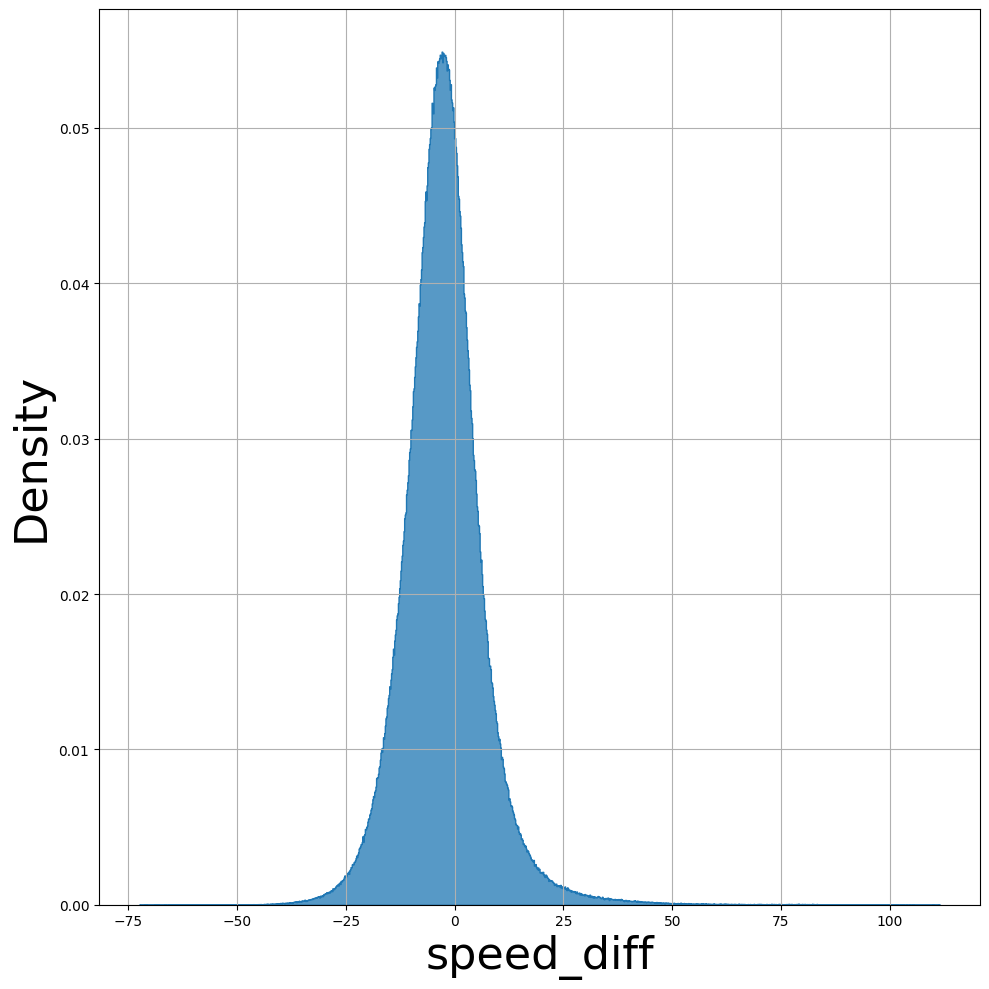

In [99]:
fig, ax = plt.subplots(1, tight_layout=True, figsize=(10, 10))
sns.histplot(
    data=ut_merged[[simplified_filter(hw) for hw in ut_merged["highway"]]],
    x="speed_diff"
    #              , hue="highway"
    ,
    element="step",
    stat="density",
)
# ax.set_yscale('log')
ax.grid()
plt.savefig(f"{CITY.title()}_Uber_histogram.pdf")

## Inspect extreme cases (speed_diff > 10)

In [100]:
df_cell_mapping = pd.read_parquet(TBASEPATH / "road_graph" / CITY / "road_graph_intersecting_cells.parquet")
df_cell_mapping

,gkey,u,v,osmid,speed_kph,maxspeed,highway,oneway,lanes,tunnel,length_meters,geometry,name,geometry_reversed,intersecting_cells
0,78112_25508583_129375498,78112,25508583,129375498,40.4,,unclassified,,,,19.407060,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle,False,"[(172, 223, 2, 0.0), (173, 223, 2, 1.0), (173,..."
1,78112_25508584_129375498,78112,25508584,129375498,40.4,,unclassified,,,,63.857249,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00R\xaf\x0...,Outer Circle,False,"[(173, 223, 0, 0.041804563658226324), (172, 22..."
2,99936_2146383887_204647020,99936,2146383887,204647020,48.3,30 mph,unclassified,,,,12.645031,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\x94o\x1...,York Gate,False,"[(176, 216, 0, 1.0)]"
3,99936_4544836433_233623258,99936,4544836433,233623258,48.3,30 mph,unclassified,,,,47.220818,b'\x01\x02\x00\x00\x00\x03\x00\x00\x00\x94o\x1...,York Gate,False,"[(175, 216, 1, 0.037851813122377106), (175, 21..."
4,99937_200047_4257261,99937,200047,4257261,48.3,30 mph,unclassified,,,,59.033945,b'\x01\x02\x00\x00\x00\x07\x00\x00\x005\x9a\\\...,York Gate,False,"[(176, 217, 3, 0.0), (176, 216, 1, 1.0), (176,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234303,6577730921_254761207_358627524,6577730921,254761207,358627524,46.2,,tertiary,,,,134.082828,b'\x01\x02\x00\x00\x00\x02\x00\x00\x00\xdfw\xc...,Golborne Road,False,"[(178, 159, 0, 0.4780438104955831), (178, 160,..."
234304,6577730921_6577730928_8227762,6577730921,6577730928,8227762,36.3,,residential,,,,51.325126,b'\x01\x02\x00\x00\x00\x04\x00\x00\x00\xdfw\xc...,Bevington Road,False,"[(178, 160, 2, 0.0), (178, 159, 0, 1.0), (178,..."
234305,6577730928_2379175_700435511,6577730928,2379175,700435511,36.3,,residential,,,,57.576832,b'\x01\x02\x00\x00\x00\x04\x00\x00\x00\x96\x7f...,Bevington Road,False,"[(178, 160, 3, 0.0), (178, 159, 1, 1.0), (178,..."
234306,6577745911_36728211_646234311,6577745911,36728211,646234311,48.3,30 mph,primary,,,,305.243521,b'\x01\x02\x00\x00\x00\x07\x00\x00\x00\x82\xdb...,Coombe Lane,False,"[(289, 130, 2, 0.38704878562390743), (288, 130..."


In [101]:
cols = [
    "year",
    "month",
    "day",
    "hour",
    "speed_diff",
    "std_speed_kph",
    "median_speed_kph",
    "speed_kph_mean",
    "free_flow_kph",
    "speed_kph",
    "length_meters",
    "x_u",
    "y_u",
    "x_v",
    "y_v",
]

extreme_edges = (
    ut_merged[ut_merged["speed_diff"] > 10]
    .groupby(["u", "v", "gkey"])
    .agg(**{col: (col, "mean") for col in cols}, count=("year", "count"), name=("name", "first"))
    .reset_index()[cols + ["name", "count", "u", "v", "gkey"]]
    .sort_values("speed_diff", ascending=False)
)
extreme_edges = extreme_edges[extreme_edges["count"] > 1]
extreme_edges

,year,month,day,hour,speed_diff,std_speed_kph,median_speed_kph,speed_kph_mean,free_flow_kph,speed_kph,length_meters,x_u,y_u,x_v,y_v,name,count,u,v,gkey
28121,2019.0,10.0,22.5,11.0,88.032703,0.000000,115.294118,27.261415,30.588235,32.2,79.060175,-0.232092,51.506305,-0.232798,51.506393,Uxbridge Road,2,185712417,185741438,185712417_185741438_371339739
49310,2019.0,10.0,26.5,10.0,86.338585,0.000000,116.235294,29.896709,32.941176,46.2,68.526761,0.055778,51.580753,0.055215,51.580502,Redbridge Lane East,2,2145776600,13982840,2145776600_13982840_4262989
24903,2019.0,10.0,25.5,12.5,84.316593,4.235294,115.764706,31.448113,30.588235,48.3,63.808651,-0.005224,51.554062,-0.005114,51.553499,High Road Leyton,2,99349425,99356048,99349425_99356048_663703203
13248,2019.0,10.0,25.0,12.5,81.935733,2.352941,111.294118,29.358385,32.000000,32.2,148.347734,-0.189523,51.552717,-0.190811,51.552368,West End Lane,2,25291140,25291139,25291140_25291139_297376896
27804,2019.0,10.0,26.5,10.0,78.765570,5.920168,117.764706,38.999136,35.764706,46.2,89.821128,0.056515,51.581082,0.055778,51.580753,Redbridge Lane East,2,149527698,2145776600,149527698_2145776600_4262989
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35667,2019.0,10.0,25.0,16.5,10.063672,1.588235,37.000000,26.936328,27.647059,32.2,55.919352,-0.092069,51.547948,-0.091877,51.548413,Wallace Road,2,475413343,1991118880,475413343_1991118880_227833720
2745,2019.0,10.0,24.0,12.5,10.049486,5.529412,29.764706,19.715220,29.647059,32.2,117.259897,-0.100924,51.575163,-0.099878,51.575301,Endymion Road,2,199449,199450,199449_199450_22605738
13309,2019.0,10.0,25.0,14.0,10.040619,9.241539,60.117647,50.077028,57.882353,64.4,929.171668,-0.114574,51.653646,-0.122744,51.651891,Enfield Road,2,25307025,7028260,25307025_7028260_24214475
23457,2019.0,10.0,25.5,14.5,10.028745,0.000000,25.882353,15.853608,19.529412,46.2,24.726212,-0.288332,51.502981,-0.288521,51.502864,Gunnersbury Drive,2,71575268,71575267,71575268_71575267_9401528


In [102]:
def show_marker_on_map(lat, lon, lat2, lon2):
    pt = (lat, lon)
    pt2 = (lat2, lon2)
    bb = [(lat - 0.001, lon - 0.001), (lat + 0.001, lon + 0.001)]
    f = folium.Figure(width=930, height=300)
    m = folium.Map().add_to(f)
    folium.Marker(pt).add_to(m)
    folium.Marker(pt2).add_to(m)
    # folium.PolyLine(line, weight=5, opacity=1).add_to(m)
    m.fit_bounds(bb)
    return m


def visualize_extreme_case(i, extreme_edges=extreme_edges):
    item = extreme_edges.iloc[i]
    print(item)
    print("intersecting_cells")
    ic = df_cell_mapping[(df_cell_mapping["gkey"] == item["gkey"])]
    assert len(ic) == 1
    ic = ic.iloc[0]
    for ic in ast.literal_eval(ic["intersecting_cells"]):
        print(f"  {ic}")
    fig, ax = plt.subplots(1, tight_layout=True, figsize=(20, 10))
    data = ut_merged[(ut_merged["u"] == item["u"]) & (ut_merged["v"] == item["v"]) & (ut_merged["gkey"] == item["gkey"])]
    ax.plot(range(len(data)), data["median_speed_kph"], label="median_speed_kph", color="red")
    ax.plot(range(len(data)), data["speed_kph_mean"], label="speed_kph_mean", color="orange")
    ax.plot(range(len(data)), data["std_speed_kph"], label="std_speed_kph", color="green")
    ax.plot(range(len(data)), data["speed_mph_stddev"], label="speed_mph_stddev", color="yellow")
    ax.axhline(item["free_flow_kph"], label="free_flow_kph", color="black")
    ax.axhline(item["speed_kph"], label="speed_kph", color="grey", linestyle="dashed")
    ax.bar(range(len(data)), data["volume"], color="blue", label="volume")
    ax.legend()
    return show_marker_on_map(item["y_u"], item["x_u"], item["y_v"], item["x_v"])

year                                       2019.0
month                                        10.0
day                                          22.5
hour                                         11.0
speed_diff                              88.032703
std_speed_kph                                 0.0
median_speed_kph                       115.294118
speed_kph_mean                          27.261415
free_flow_kph                           30.588235
speed_kph                                    32.2
length_meters                           79.060175
x_u                                     -0.232092
y_u                                     51.506305
x_v                                     -0.232798
y_v                                     51.506393
name                                Uxbridge Road
count                                           2
u                                       185712417
v                                       185741438
gkey                185712417_185741438_371339739


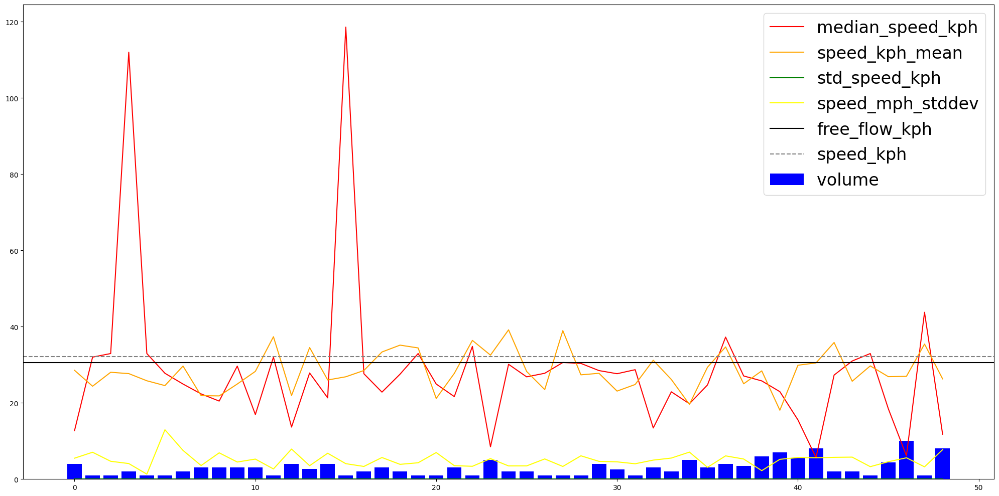

In [103]:
visualize_extreme_case(0)

year                                         2019.0
month                                          10.0
day                                            23.5
hour                                            8.5
speed_diff                                63.333904
std_speed_kph                                   0.0
median_speed_kph                          95.058824
speed_kph_mean                            31.724919
free_flow_kph                             33.882353
speed_kph                                      32.2
length_meters                              19.41766
x_u                                        -0.10762
y_u                                       51.511027
x_v                                       -0.107466
y_v                                       51.511108
name                            Victoria Embankment
count                                             2
u                                        4166662878
v                                        4696544885
gkey        

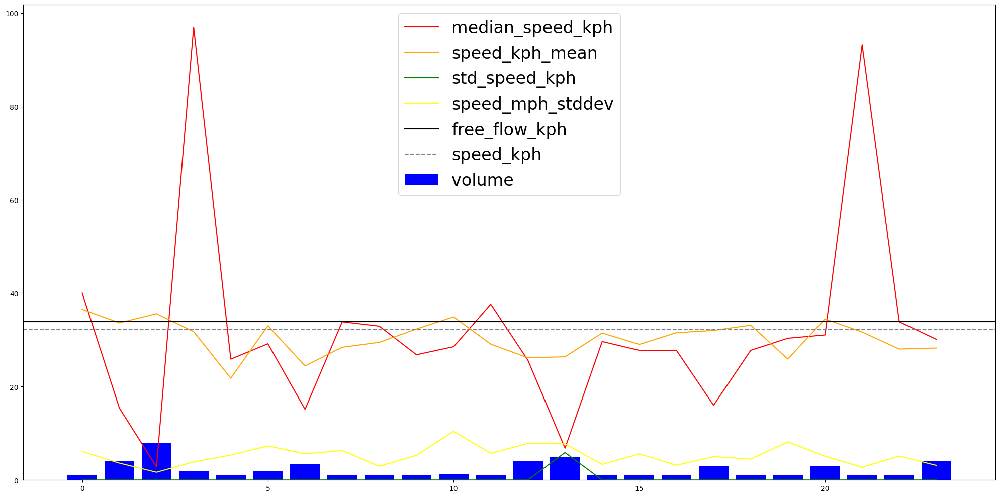

In [104]:
visualize_extreme_case(55)

year                                       2019.0
month                                        10.0
day                                          26.0
hour                                         14.0
speed_diff                              57.369986
std_speed_kph                            3.647059
median_speed_kph                        72.352941
speed_kph_mean                          14.982955
free_flow_kph                                40.0
speed_kph                                    48.3
length_meters                           47.104244
x_u                                     -0.365572
y_u                                     51.549404
x_v                                     -0.365971
y_v                                     51.549263
name                              Mandeville Road
count                                           2
u                                        25628830
v                                      3091468698
gkey                25628830_3091468698_226117648


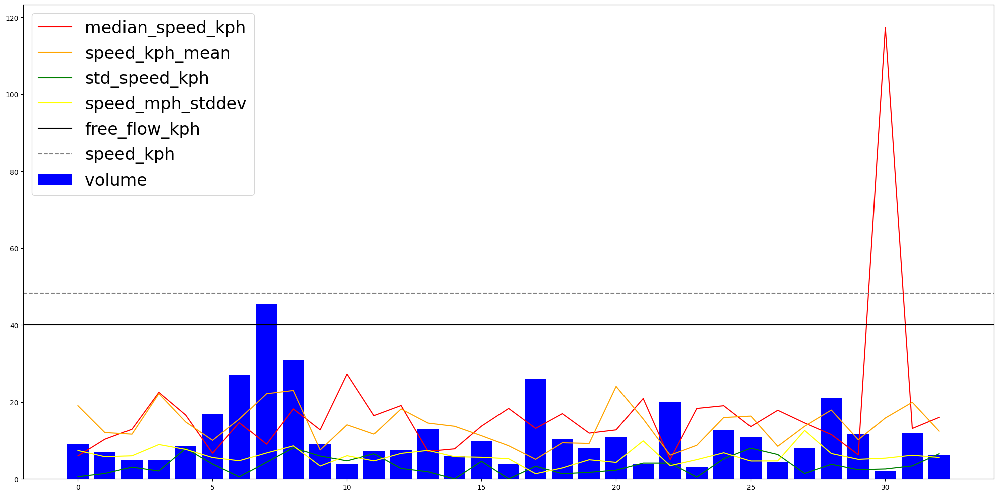

In [105]:
visualize_extreme_case(105)

year                                     2019.0
month                                      10.0
day                                        25.0
hour                                       12.5
speed_diff                            81.935733
std_speed_kph                          2.352941
median_speed_kph                     111.294118
speed_kph_mean                        29.358385
free_flow_kph                              32.0
speed_kph                                  32.2
length_meters                        148.347734
x_u                                   -0.189523
y_u                                   51.552717
x_v                                   -0.190811
y_v                                   51.552368
name                              West End Lane
count                                         2
u                                      25291140
v                                      25291139
gkey                25291140_25291139_297376896
Name: 13248, dtype: object
intersecting_

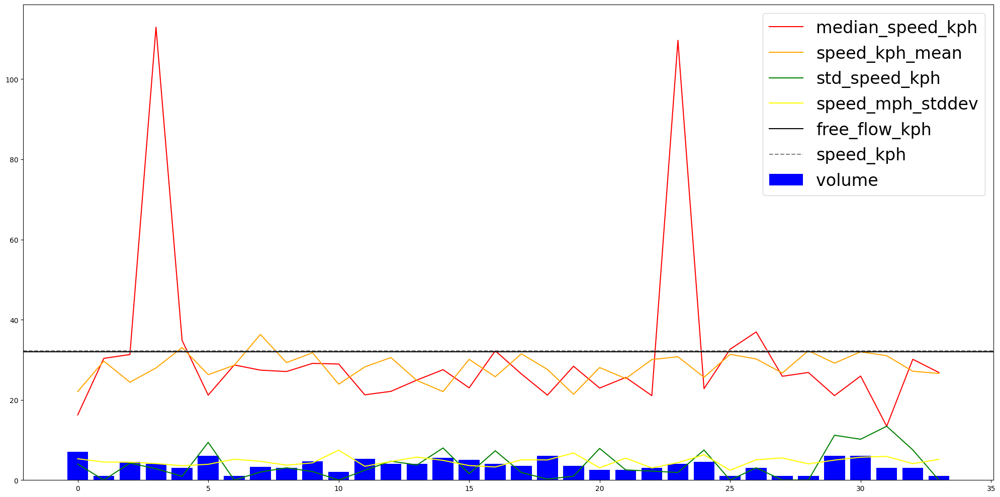

In [106]:
visualize_extreme_case(3)

year                                      2019.0
month                                       10.0
day                                         26.5
hour                                        10.0
speed_diff                              78.76557
std_speed_kph                           5.920168
median_speed_kph                      117.764706
speed_kph_mean                         38.999136
free_flow_kph                          35.764706
speed_kph                                   46.2
length_meters                          89.821128
x_u                                     0.056515
y_u                                    51.581082
x_v                                     0.055778
y_v                                    51.580753
name                         Redbridge Lane East
count                                          2
u                                      149527698
v                                     2145776600
gkey                149527698_2145776600_4262989
Name: 27804, dtype: 

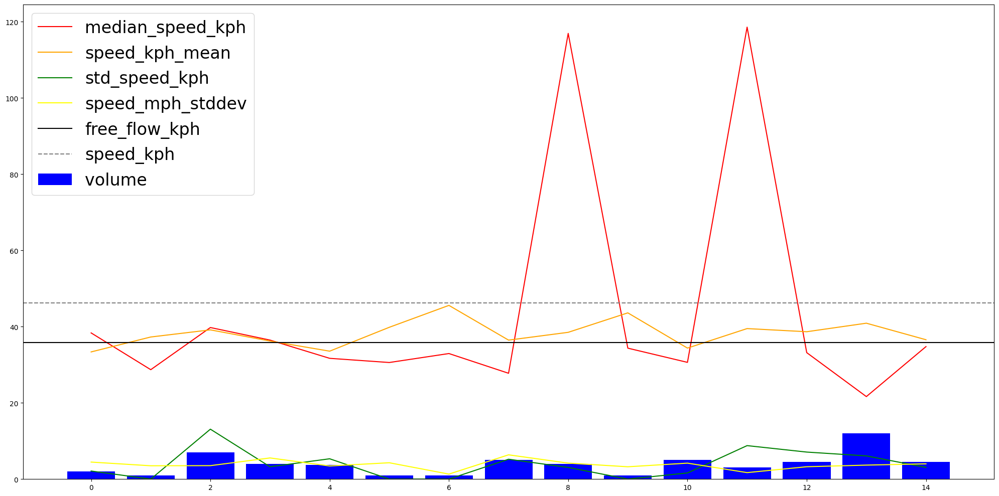

In [107]:
visualize_extreme_case(4)

year                                   2019.0
month                                    10.0
day                                      25.0
hour                                      9.5
speed_diff                          78.237951
std_speed_kph                        0.588235
median_speed_kph                   115.647059
speed_kph_mean                      37.409108
free_flow_kph                       33.882353
speed_kph                                32.2
length_meters                      201.685049
x_u                                 -0.103364
y_u                                 51.399986
x_v                                  -0.10486
y_v                                 51.401011
name                             Melfort Road
count                                       2
u                                    27351936
v                                    27352028
gkey                27351936_27352028_8415883
Name: 17815, dtype: object
intersecting_cells
  (300, 265, 1, 0.0137971024455104

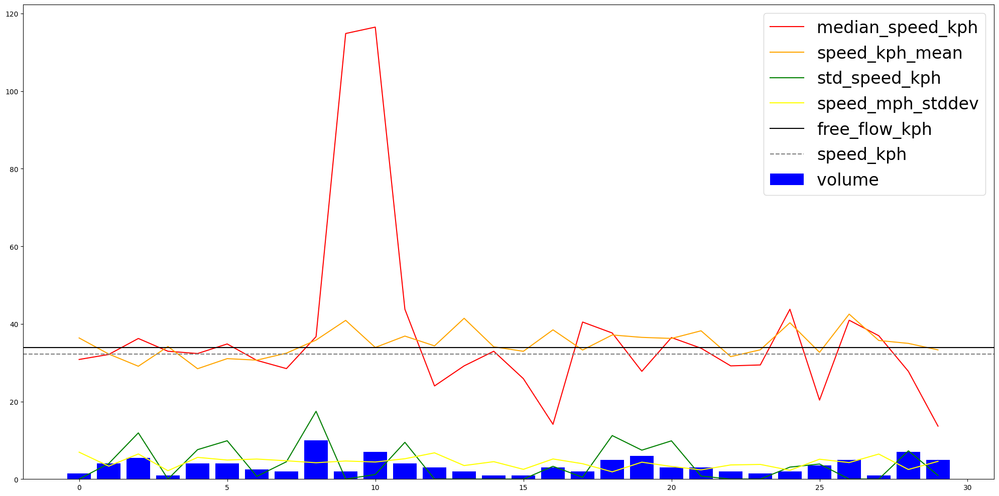

In [108]:
visualize_extreme_case(5)

year                                  2019.0
month                                   10.0
day                                     24.5
hour                                     9.5
speed_diff                         71.692744
std_speed_kph                      13.882353
median_speed_kph                  101.882353
speed_kph_mean                     30.189609
free_flow_kph                      21.647059
speed_kph                               48.3
length_meters                      71.423292
x_u                                -0.158436
y_u                                51.519092
x_v                                -0.157802
y_v                                51.519199
name                           Dorset Street
count                                      2
u                                     275423
v                                  298207193
gkey                275423_298207193_4253850
Name: 4221, dtype: object
intersecting_cells
  (180, 210, 0, 0.6878814291346372)
  (180, 211, 0, 0.3

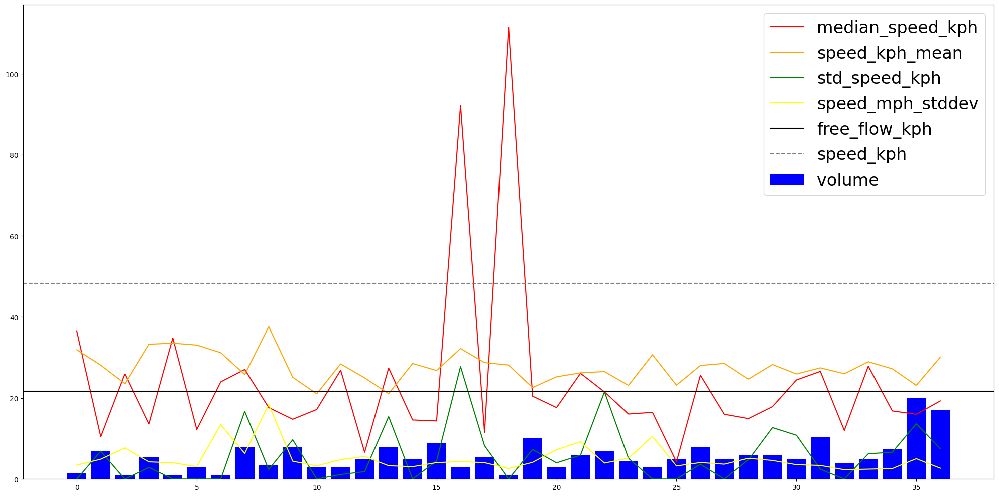

In [109]:
visualize_extreme_case(15)

## Inspect extreme cases (speed_diff < -10 and median_speed_kph < 15)

In [110]:
cols = [
    "year",
    "month",
    "day",
    "hour",
    "speed_diff",
    "std_speed_kph",
    "median_speed_kph",
    "speed_kph_mean",
    "free_flow_kph",
    "speed_kph",
    "length_meters",
    "x_u",
    "y_u",
    "x_v",
    "y_v",
]

extreme_edges_low = (
    ut_merged[(ut_merged["speed_diff"] < -10) & (ut_merged["median_speed_kph"] < 15)]
    .groupby(["u", "v", "gkey"])
    .agg(**{col: (col, "mean") for col in cols}, count=("year", "count"), name=("name", "first"), highway=("highway", "first"))
    .reset_index()[cols + ["name", "count", "u", "v", "gkey", "highway"]]
    .sort_values("speed_diff", ascending=True)
)
extreme_edges_low = extreme_edges_low[extreme_edges_low["count"] > 1]
extreme_edges_low

,year,month,day,hour,speed_diff,std_speed_kph,median_speed_kph,speed_kph_mean,free_flow_kph,speed_kph,...,x_u,y_u,x_v,y_v,name,count,u,v,gkey,highway
4203,2019.0,10.0,26.0,11.333333,-59.466194,16.442566,7.930283,67.396477,72.941176,80.5,...,0.050827,51.455107,0.053296,51.455369,Rochester Way Relief Road,3,432734,432731,432734_432731_22970524,trunk
40004,2019.0,10.0,24.5,10.500000,-58.452122,0.000000,9.676471,68.128593,65.411765,64.4,...,-0.182366,51.458718,-0.182579,51.458939,Trinity Road,4,5209614954,5209614956,5209614954_5209614956_538150370,trunk
20620,2019.0,10.0,24.5,14.500000,-56.941379,0.000000,6.794118,63.735497,17.882353,36.3,...,-0.142236,51.494328,-0.142337,51.494501,Wilton Road,4,245802474,810371985,245802474_810371985_67076654,residential
39052,2019.0,10.0,23.0,14.000000,-53.711767,6.088235,13.813725,67.525492,20.000000,36.3,...,-0.075744,51.511170,-0.075678,51.510855,America Square,2,4777885222,4777885221,4777885222_4777885221_485031956,residential
16004,2019.0,10.0,27.0,15.000000,-51.183644,10.867195,7.882353,59.065997,58.823529,48.3,...,-0.235670,51.573757,-0.233551,51.572036,Edgware Road,2,42324714,242703635,42324714_242703635_22633180,primary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40463,2019.0,10.0,23.5,14.500000,-10.092184,6.873519,11.735294,21.827478,28.705882,32.2,...,-0.058086,51.538919,-0.058015,51.538922,Exmouth Place,2,5276609923,467761729,5276609923_467761729_545964843,unclassified
15695,2019.0,10.0,26.0,15.000000,-10.077709,1.294118,12.588235,22.665945,24.000000,36.3,...,-0.160815,51.488808,-0.161999,51.488057,St. Leonard's Terrace,2,37879363,37877761,37879363_37877761_5319173,residential
31843,2019.0,10.0,24.0,11.500000,-10.070841,3.117647,11.176471,21.247311,25.411765,48.3,...,-0.031033,51.580058,-0.030825,51.580112,,2,1714747609,1714747635,1714747609_1714747635_220382211,primary
10617,2019.0,10.0,22.5,11.500000,-10.070076,3.000000,12.294118,22.364193,27.764706,32.2,...,-0.107128,51.501312,-0.106687,51.501224,Webber Street,2,25499047,24923325,25499047_24923325_407944600,residential


year                                   2019.0
month                                    10.0
day                                      26.0
hour                                11.333333
speed_diff                         -59.466194
std_speed_kph                       16.442566
median_speed_kph                     7.930283
speed_kph_mean                      67.396477
free_flow_kph                       72.941176
speed_kph                                80.5
length_meters                      276.105364
x_u                                  0.050827
y_u                                 51.455107
x_v                                  0.053296
y_v                                 51.455369
name                Rochester Way Relief Road
count                                       3
u                                      432734
v                                      432731
gkey                   432734_432731_22970524
highway                                 trunk
Name: 4203, dtype: object
intersec

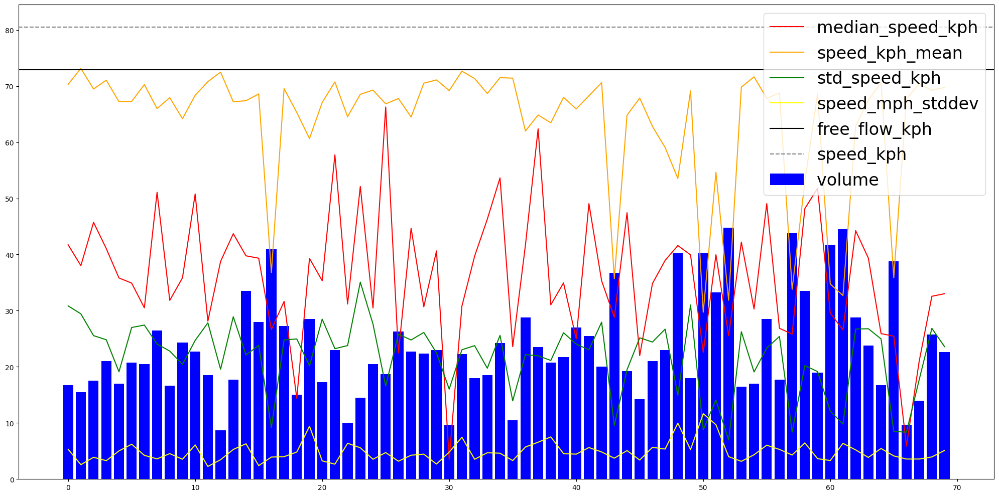

In [111]:
visualize_extreme_case(0, extreme_edges_low)

year                                         2019.0
month                                          10.0
day                                            24.5
hour                                           10.5
speed_diff                               -58.452122
std_speed_kph                                   0.0
median_speed_kph                           9.676471
speed_kph_mean                            68.128593
free_flow_kph                             65.411765
speed_kph                                      64.4
length_meters                             34.130031
x_u                                       -0.182366
y_u                                       51.458718
x_v                                       -0.182579
y_v                                       51.458939
name                                   Trinity Road
count                                             4
u                                        5209614954
v                                        5209614956
gkey        

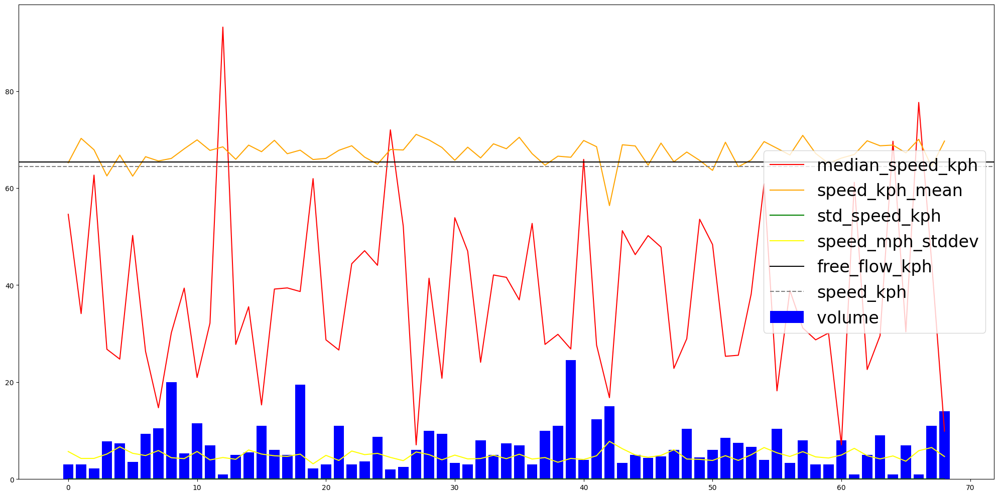

In [112]:
visualize_extreme_case(1, extreme_edges_low)

year                                      2019.0
month                                       10.0
day                                         24.5
hour                                        14.5
speed_diff                            -56.941379
std_speed_kph                                0.0
median_speed_kph                        6.794118
speed_kph_mean                         63.735497
free_flow_kph                          17.882353
speed_kph                                   36.3
length_meters                           22.22228
x_u                                    -0.142236
y_u                                    51.494328
x_v                                    -0.142337
y_v                                    51.494501
name                                 Wilton Road
count                                          4
u                                      245802474
v                                      810371985
gkey                245802474_810371985_67076654
highway             

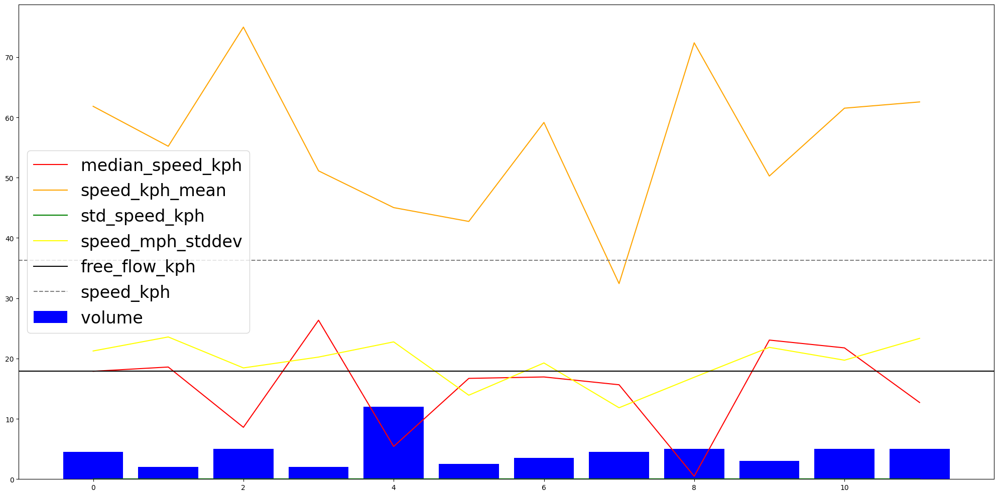

In [113]:
visualize_extreme_case(2, extreme_edges_low)

year                                        2019.0
month                                         10.0
day                                           22.5
hour                                     13.666667
speed_diff                              -38.721659
std_speed_kph                             4.263332
median_speed_kph                         10.482571
speed_kph_mean                           49.204229
free_flow_kph                            73.411765
speed_kph                                     64.4
length_meters                           127.898681
x_u                                      -0.092715
y_u                                      51.616108
x_v                                      -0.093863
y_v                                      51.616035
name                                              
count                                            6
u                                       1447888927
v                                        251610047
gkey                1447888927_

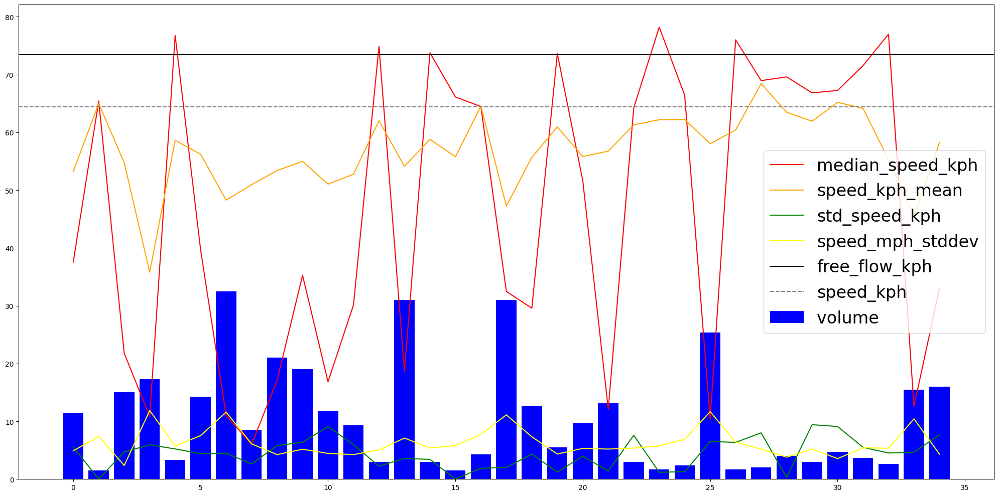

In [114]:
visualize_extreme_case(55, extreme_edges_low)

year                                        2019.0
month                                         10.0
day                                           27.0
hour                                          15.0
speed_diff                              -34.880412
std_speed_kph                             3.058824
median_speed_kph                          7.176471
speed_kph_mean                           42.056882
free_flow_kph                            47.294118
speed_kph                                     48.3
length_meters                             58.01353
x_u                                       -0.09605
y_u                                       51.35024
x_v                                      -0.095741
y_v                                      51.349819
name                              Sanderstead Road
count                                            2
u                                        128276605
v                                       1554897287
gkey                128276605_1

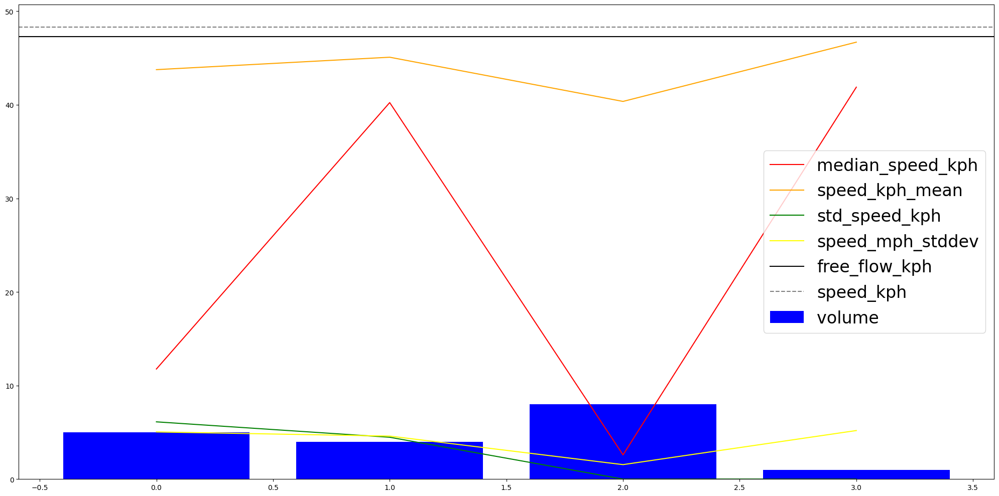

In [115]:
visualize_extreme_case(157, extreme_edges_low)

year                                       2019.0
month                                        10.0
day                                         25.25
hour                                         14.0
speed_diff                             -24.867304
std_speed_kph                            7.578431
median_speed_kph                         9.990196
speed_kph_mean                            34.8575
free_flow_kph                           26.823529
speed_kph                                    48.3
length_meters                           21.242384
x_u                                     -0.086003
y_u                                     51.380548
x_v                                     -0.085815
y_v                                     51.380585
name                                 Morland Road
count                                           4
u                                       107204933
v                                       107204935
gkey                107204933_107204935_122625727


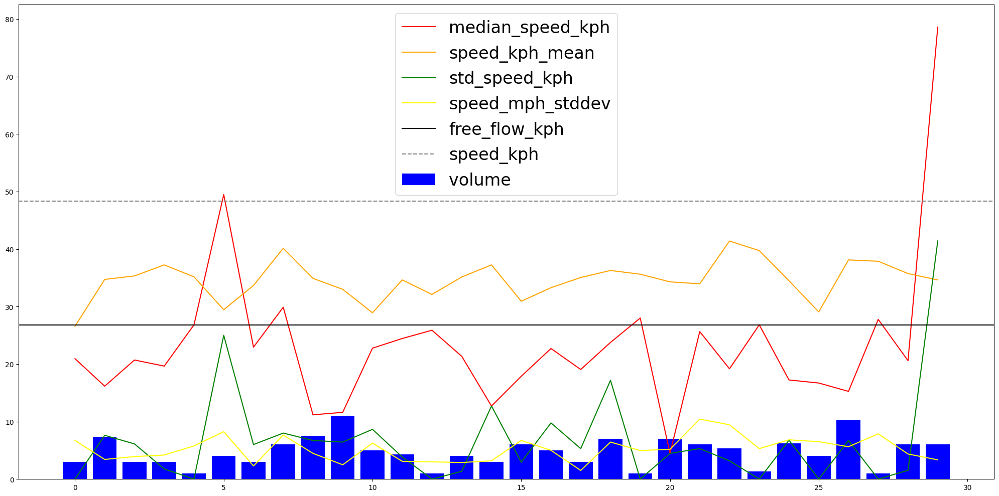

In [116]:
visualize_extreme_case(2000, extreme_edges_low)

year                                      2019.0
month                                       10.0
day                                    24.086957
hour                                   12.434783
speed_diff                             -20.71833
std_speed_kph                           5.020318
median_speed_kph                       11.269821
speed_kph_mean                         31.988151
free_flow_kph                          25.882353
speed_kph                                   48.3
length_meters                         104.327571
x_u                                    -0.170568
y_u                                    51.460131
x_v                                     -0.16967
y_v                                    51.460405
name                              Battersea Rise
count                                         23
u                                     4946959991
v                                       26479857
gkey                4946959991_26479857_42675697
highway             

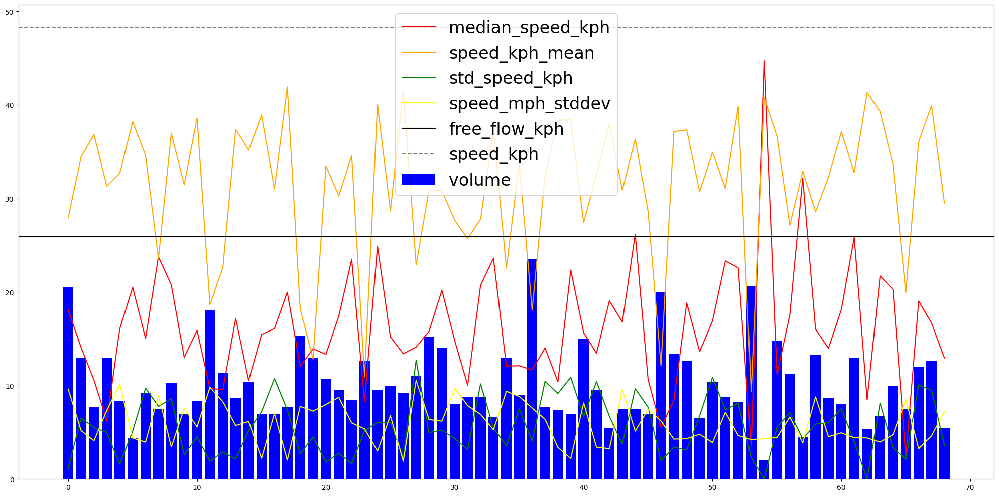

In [117]:
visualize_extreme_case(5000, extreme_edges_low)

year                                     2019.0
month                                      10.0
day                                        22.5
hour                                       12.5
speed_diff                           -17.381468
std_speed_kph                          1.509804
median_speed_kph                      10.843137
speed_kph_mean                        28.224605
free_flow_kph                              24.0
speed_kph                                  46.2
length_meters                         17.110785
x_u                                   -0.041003
y_u                                   51.628268
x_v                                   -0.041155
y_v                                    51.62829
name                        Pickett's Lock Lane
count                                         2
u                                    1430279210
v                                        920214
gkey                1430279210_920214_609317296
highway                                t

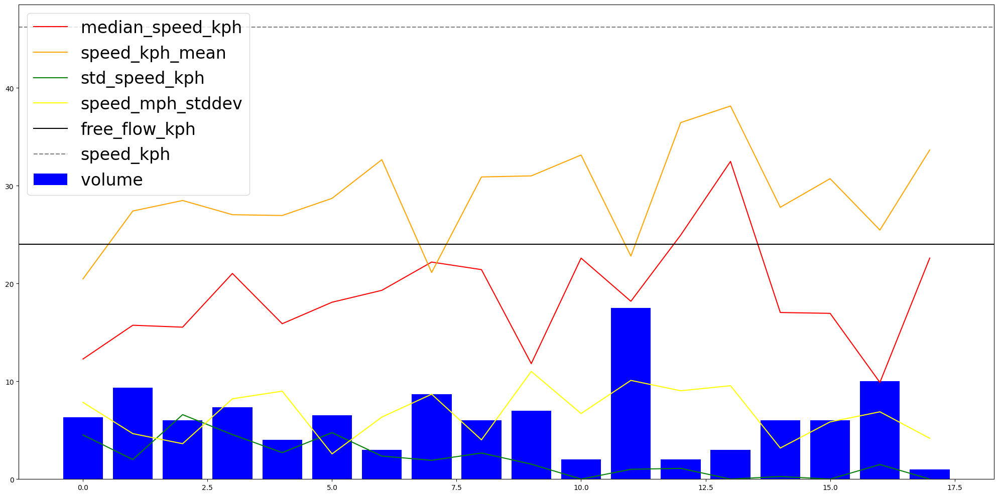

In [118]:
visualize_extreme_case(9999, extreme_edges_low)

year                                    2019.0
month                                     10.0
day                                       25.0
hour                                      16.0
speed_diff                          -16.399775
std_speed_kph                         2.294118
median_speed_kph                     12.176471
speed_kph_mean                       28.576246
free_flow_kph                        28.705882
speed_kph                                 32.2
length_meters                        58.904383
x_u                                  -0.076496
y_u                                  51.455589
x_v                                  -0.076198
y_v                                  51.456027
name                             Lordship Lane
count                                        2
u                                     21586034
v                                     33778200
gkey                21586034_33778200_38697242
highway                                primary
Name: 8841, d

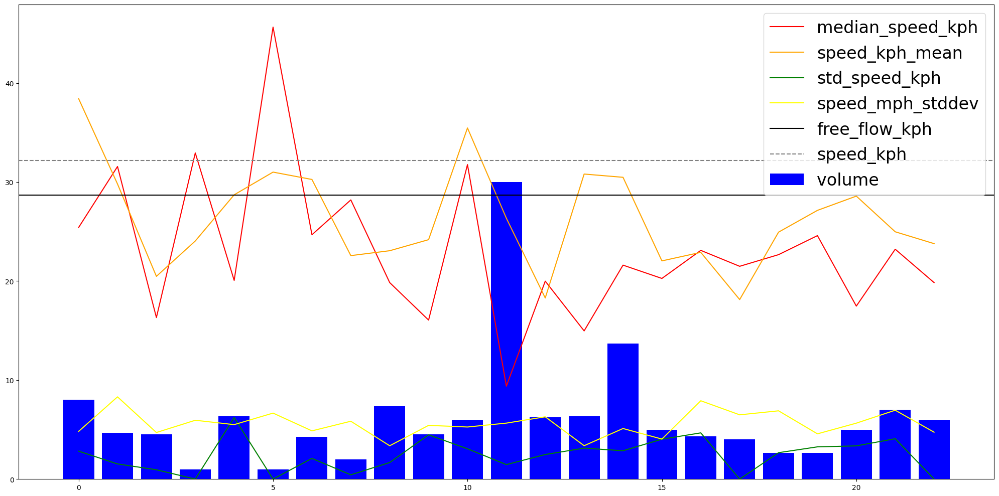

In [119]:
visualize_extreme_case(12000, extreme_edges_low)

In [120]:
extreme_edges_low.groupby("highway").count()

,year,month,day,hour,speed_diff,std_speed_kph,median_speed_kph,speed_kph_mean,free_flow_kph,speed_kph,length_meters,x_u,y_u,x_v,y_v,name,count,u,v,gkey
highway,,,,,,,,,,,,,,,,,,,,
living_street,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23,23
primary,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035,11035
primary_link,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89,89
residential,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561,2561
secondary,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322,3322
secondary_link,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25,25
service,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
tertiary,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081,4081
tertiary_link,21,21,21,21,21,21,21,21,21,21,21,21,21,21,21,21,21,21,21,21


In [121]:
extreme_edges_low.groupby("highway").median()

/var/folders/4x/y75rw_lj5xx6xc0bmv1gxmq80000gs/T/ipykernel_5568/2741189692.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  extreme_edges_low.groupby("highway").median()


,year,month,day,hour,speed_diff,std_speed_kph,median_speed_kph,speed_kph_mean,free_flow_kph,speed_kph,length_meters,x_u,y_u,x_v,y_v,count,u,v
highway,,,,,,,,,,,,,,,,,,
living_street,2019.0,10.0,23.714286,13.000000,-14.158496,3.443355,11.025531,23.499261,26.352941,32.2,39.966399,-0.174105,51.498615,-0.174105,51.498615,9.0,3.879402e+08,3.879397e+08
primary,2019.0,10.0,24.200000,13.000000,-16.181563,2.681373,10.781513,27.195700,29.647059,48.3,39.256230,-0.126310,51.511351,-0.126257,51.511437,4.0,3.064626e+08,3.435881e+08
primary_link,2019.0,10.0,24.000000,13.500000,-15.250824,2.023693,11.271732,26.503416,28.705882,48.3,26.562954,-0.102443,51.511631,-0.102217,51.511816,4.0,1.617532e+09,1.794637e+09
residential,2019.0,10.0,24.000000,12.800000,-15.179051,2.407217,10.088235,25.473438,25.882353,32.2,60.989847,-0.152651,51.502592,-0.152534,51.502622,3.0,7.097044e+07,1.857145e+08
secondary,2019.0,10.0,24.000000,12.800000,-15.993208,2.470588,10.683551,26.979834,28.705882,32.2,43.594467,-0.145924,51.513726,-0.145912,51.513805,3.0,3.116148e+08,3.519849e+08
secondary_link,2019.0,10.0,24.000000,12.500000,-16.170175,1.529412,12.257353,27.762724,24.000000,48.1,29.420497,-0.135074,51.527702,-0.135074,51.527628,3.0,1.937820e+09,1.697714e+09
service,2019.0,10.0,23.291667,12.368421,-15.210651,0.154902,10.492157,26.041662,22.117647,32.2,27.965149,-0.126679,51.515670,-0.126535,51.515876,24.0,1.937730e+09,3.304492e+07
tertiary,2019.0,10.0,24.000000,12.750000,-16.049240,2.490196,10.588235,26.789074,27.764706,32.2,48.801236,-0.120801,51.519261,-0.120709,51.519330,3.0,2.696638e+08,3.014799e+08
tertiary_link,2019.0,10.0,24.500000,14.666667,-15.439546,3.748366,11.264706,27.235446,50.039216,48.3,45.638910,-0.064443,51.523991,-0.064531,51.523651,3.0,2.429309e+08,1.203361e+09


In [122]:
extreme_edges_low.groupby("highway").max()

,year,month,day,hour,speed_diff,std_speed_kph,median_speed_kph,speed_kph_mean,free_flow_kph,speed_kph,length_meters,x_u,y_u,x_v,y_v,name,count,u,v,gkey
highway,,,,,,,,,,,,,,,,,,,,
living_street,2019.0,10.0,26.00000,13.916667,-10.848278,6.837468,13.405637,30.143341,28.235294,48.3,132.420979,-0.084036,51.524666,-0.084303,51.524666,Leonard Street,23,6280192965,6280192965,6280192965_6280192964_670644197
primary,2019.0,10.0,27.00000,17.000000,-10.070841,27.600666,14.965686,59.400471,78.666667,96.6,987.907499,0.074221,51.692209,0.067389,51.692373,York Way,69,6552047209,6554185527,996609840_110126662_696046857
primary_link,2019.0,10.0,27.00000,17.000000,-10.118540,18.838698,14.166667,48.816110,78.588235,80.5,336.284398,0.066229,51.602527,0.066013,51.602509,Woolwich Road,69,6530619881,6530619874,96065677_2143402935_204338368
residential,2019.0,10.0,27.00000,17.000000,-10.010268,13.294118,14.911765,67.525492,76.705882,48.3,647.663062,0.052865,51.621001,0.052779,51.621253,Young Street,57,6575658505,6575658507,99601871_726040784_38809706
secondary,2019.0,10.0,27.00000,17.000000,-10.179159,18.878507,14.882353,47.747508,79.058824,64.4,724.887900,0.064725,51.691241,0.064790,51.691846,Wrythe Lane,63,6565099578,6565107318,996556248_773374272_3997711
secondary_link,2019.0,10.0,25.25000,16.500000,-11.204813,8.634552,13.647059,33.141139,80.941176,80.5,282.465063,-0.008815,51.606879,-0.006344,51.606934,York Road,16,5374174120,5374174223,5374174120_5374174223_557204290
service,2019.0,10.0,23.46875,13.400000,-13.012888,4.558773,10.866558,48.110254,32.470588,33.6,30.761112,-0.126407,51.516121,-0.126345,51.516286,Wandsworth Road,38,5630766895,5630766895,5630766895_26699560_589659240
tertiary,2019.0,10.0,27.00000,17.000000,-10.109287,14.288898,14.882353,52.291480,86.117647,80.5,935.504468,0.066572,51.664842,0.067189,51.663962,Yester Road,66,6577730921,6577730921,995078611_995078573_4396487
tertiary_link,2019.0,10.0,27.00000,17.000000,-11.955923,7.454896,14.607843,63.760441,78.588235,80.5,536.112598,0.032436,51.616158,0.032571,51.616290,West Way,15,4060361447,4927602968,4060361447_4060361460_403701798


In [123]:
extreme_edges_low[extreme_edges_low["length_meters"] > 150]

,year,month,day,hour,speed_diff,std_speed_kph,median_speed_kph,speed_kph_mean,free_flow_kph,speed_kph,...,x_u,y_u,x_v,y_v,name,count,u,v,gkey,highway
4203,2019.0,10.0,26.0,11.333333,-59.466194,16.442566,7.930283,67.396477,72.941176,80.5,...,0.050827,51.455107,0.053296,51.455369,Rochester Way Relief Road,3,432734,432731,432734_432731_22970524,trunk
16004,2019.0,10.0,27.0,15.000000,-51.183644,10.867195,7.882353,59.065997,58.823529,48.3,...,-0.235670,51.573757,-0.233551,51.572036,Edgware Road,2,42324714,242703635,42324714_242703635_22633180,primary
8380,2019.0,10.0,26.0,9.666667,-50.422144,10.437480,12.666667,63.088810,62.588235,64.4,...,-0.104700,51.368309,-0.103207,51.369414,The Croydon Flyover,3,21381847,78326960,21381847_78326960_10423847,trunk
20205,2019.0,10.0,27.0,15.000000,-48.349960,13.828612,7.591503,55.941463,46.588235,48.3,...,-0.233551,51.572036,-0.230477,51.569591,Edgware Road West,2,242703635,525071,242703635_525071_22633385,primary
40890,2019.0,10.0,27.0,15.500000,-48.261743,6.621994,7.411765,55.673508,54.588235,64.4,...,-0.028890,51.652484,-0.029947,51.648989,Mollison Avenue,2,5460946893,283333835,5460946893_283333835_567247990,primary
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40472,2019.0,10.0,24.5,16.500000,-10.434391,4.440011,12.627451,23.061842,38.823529,48.3,...,-0.106941,51.625549,-0.105470,51.624677,Bourne Hill,2,5277517867,201187,5277517867_201187_23245270,primary
23081,2019.0,10.0,23.0,14.500000,-10.348883,9.294118,12.588235,22.937118,24.941176,32.2,...,-0.106587,51.541410,-0.108066,51.541211,Lofting Road,2,332673180,332673185,332673180_332673185_2430956,unclassified
3455,2019.0,10.0,23.5,13.000000,-10.323234,4.764549,12.421569,22.744802,30.588235,48.3,...,-0.183047,51.490760,-0.181068,51.488547,Drayton Gardens,2,276554,18127040,276554_18127040_4422803,tertiary
36739,2019.0,10.0,24.0,16.000000,-10.150995,5.537865,13.117647,23.268642,30.470588,32.2,...,-0.191564,51.472482,-0.190091,51.471774,Hazlebury Road,2,3451067745,13565582,3451067745_13565582_4422135,residential
